## Analysis fMRI beh and Psychophysics

Import data and libraries

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import os
import pandas as pd

%run "C:\\Users\\David\\Documents\\GitHub\\wm_distractor_filtering\\psychophysics\\Funciones.ipynb"

df_psy = pd.read_csv('C:\\Users\\David\\Dropbox\\KAROLINSKA\\task\\POSITIONS\\L3_d0,2&7_rad8_resp_same\\behaviour_psychophysics_corrected')
df_fMRI = pd.read_csv('C:\\Users\\David\\Dropbox\\KAROLINSKA\\fMRI_beh_analysis\\behaviour_fMRI')

from numpy import loadtxt, shape, array, zeros, delete, argsort, mean, std, unique
import itertools
from itertools import chain
import matplotlib.pyplot as plt
import pickle
from pickle import *
import statsmodels.formula.api as sm
from scipy.stats import norm, ttest_1samp
import os
import seaborn as sns
from scipy.stats import norm, ttest_1samp
from numpy import polyfit, poly1d
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf
import statsmodels.api as sm
from scikits.bootstrap import ci
import scikit_posthocs as sp
import ptitprince as pt
from linares_plot import * 


Take the specific columns to concatenate

In [2]:
df_analysis_psy = df_psy[[ 'A_err',  'Interference', 'A_R', 'A_err_abs', 'delay', 'distance', 'subject',
                  'order', 'orient', 'type', 'A_dist', 'A_T',  'A_err_int_theoretical', 'A_res', 'A_err_theoretical' ]]

df_analysis_fMRI = df_fMRI[[ 'A_err',  'Interference', 'A_R', 'A_err_abs', 'delay', 'distance', 'subject',
                  'order', 'orient', 'type', 'A_dist', 'A_T',  'A_err_int_theoretical', 'A_res', 'A_err_theoretical' ]]



df_analysis_psy['environment']='psychophysics'
df_analysis_fMRI['environment']='fMRI'

df_analysis = pd.concat([df_analysis_psy, df_analysis_fMRI], ignore_index=True)

print('N = ' + str(len(df_analysis) ))
print('N psychophysics = ' + str(len(df_analysis_psy) ))
print('N fMRI = ' + str(len(df_analysis_fMRI) ))

N = 6661
N psychophysics = 4774
N fMRI = 1887


C:\Users\David\Anaconda3\envs\python3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\David\Anaconda3\envs\python3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.


Process:  
+ Take the interesting columns.  
+ Exclude the type 4 (controls).  
+ Correction of types depending on distance.  
+ Columns of cw_ccw, interference, sex, in_out, condition.

In [3]:
df_analysis = df_analysis.loc[df_analysis['type']!=4]
df_analysis.rename(columns={'orient': 'cond'}, inplace=True)
df_analysis['cw_ccw']=[cw_ccw_detector(df_analysis['A_T'].iloc[i], df_analysis['A_dist'].iloc[i]) for i in range(0, len(df_analysis))]

df_analysis['Interference_col'] = df_analysis['A_err'].copy()
df_analysis.loc[df_analysis['cw_ccw']=='cw', 'Interference_col'] = df_analysis.loc[df_analysis['cw_ccw']=='cw', 'Interference_col']*-1

df_analysis['sex']=[male_female(df_analysis['subject'].loc[ind]) for ind in df_analysis.index]

#In case you want to try other alternatives
#df_analysis.rename(columns={'A_err_theoretical': 'A_err'}, inplace=True)
#df_analysis.rename(columns={'A_err_jh': 'A_err'}, inplace=True)

#correction of the types 1: <20, 2: 20-30, 3: >30
for i in df_analysis.index:
    if df_analysis.loc[i].distance <20 :
        t =1
    elif df_analysis.loc[i].distance >30 :
        t =3
    else:
        t=2
    
    #print(t)
    df_analysis.loc[i, 'type'] = t



df_analysis['dist_in_out'] = df_analysis['type'].copy() 
df_analysis['dist_in_out'] = df_analysis['dist_in_out'].replace([1 ,2, 3], ['in', 'in', 'out'])



df_analysis['ord_del_cond'] = df_analysis[['delay','order']].sum(axis=1)
df_analysis['ord_del_cond'] = df_analysis['ord_del_cond'].replace([1.2, 2.2, 8, 9], ['1_d02', '2_d02', '1_d7', '2_d7'])



Distance cw-ccw peaks.
New measure that takes the distance between cw and ccw trials instead the T-R measure. cw-ccw measure is more reliable.  
+ More statistical power.  
+ Resistant to perceptual effects.  

In [4]:
##### MEAN OF CW AND CCW COLLAPSING IN 

means_cw={}

for Subj in df_analysis.subject.unique():
    d_subj = df_analysis.groupby('subject').get_group(Subj)
    for ori in ['cw', 'ccw']:
        for Dist in df_analysis.dist_in_out.unique():
            for Cond_4 in df_analysis.ord_del_cond.unique():
                mean_cw = round(d_subj.loc[ (d_subj['cw_ccw']==ori)  & (d_subj['ord_del_cond']==Cond_4) &
                                           (d_subj['dist_in_out']==Dist), 'A_err_theoretical'   ].mean(), 3)
                means_cw[str(Subj)  + '_' + str(Cond_4) + '_' + str(Dist) + '_' + ori] = mean_cw
                

        
cw_ccw_distance=[]

for i in df_analysis.index:
    or_ = df_analysis.loc[i, 'cw_ccw']
    if or_ == 'cw':
        or_cont = 'ccw'
    elif or_ =='ccw':
        or_cont = 'cw' 
    else:
        print('Error')
    idx =  str(df_analysis.loc[i, 'subject'])+ '_' + df_analysis.loc[i, 'ord_del_cond'] +'_' + df_analysis.loc[i, 'dist_in_out'] + '_'+ or_cont
    #
    if or_ == 'ccw':
        cw_ccw_distance.append( (df_analysis.loc[i, 'A_err_theoretical'] - means_cw[idx])/2 )  
    elif or_ =='cw':
        cw_ccw_distance.append( (means_cw[idx] - df_analysis.loc[i, 'A_err_theoretical'])/2 )  
    else:
        print('Error')
    


df_analysis['distance_A_err'] = cw_ccw_distance

In [5]:
means_cw={}

for Subj in df_analysis.subject.unique():
    d_subj = df_analysis.groupby('subject').get_group(Subj)
    for ori in ['cw', 'ccw']:
        for Dist in df_analysis.type.unique():
            for Cond_4 in df_analysis.ord_del_cond.unique():
                mean_cw = round(d_subj.loc[ (d_subj['cw_ccw']==ori)  & (d_subj['ord_del_cond']==Cond_4) &
                                           (d_subj['type']==Dist), 'A_err_theoretical'   ].mean(), 3)
                means_cw[str(Subj)  + '_' + str(Cond_4) + '_' + str(Dist) + '_' + ori] = mean_cw
                

        
cw_ccw_distance=[]

for i in df_analysis.index:
    or_ = df_analysis.loc[i, 'cw_ccw']
    if or_ == 'cw':
        or_cont = 'ccw'
    elif or_ =='ccw':
        or_cont = 'cw' 
    else:
        print('Error')
    idx =  str(df_analysis.loc[i, 'subject'])+ '_' + df_analysis.loc[i, 'ord_del_cond'] +'_' + str(df_analysis.loc[i, 'type']) + '_'+ or_cont
    #
    if or_ == 'ccw':
        cw_ccw_distance.append( (df_analysis.loc[i, 'A_err_theoretical'] - means_cw[idx])/2 )  
    elif or_ =='cw':
        cw_ccw_distance.append( (means_cw[idx] - df_analysis.loc[i, 'A_err_theoretical'])/2 )  
    else:
        print('Error')
    


df_analysis['distance_A_err'] = cw_ccw_distance

Subject by Subject plots

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


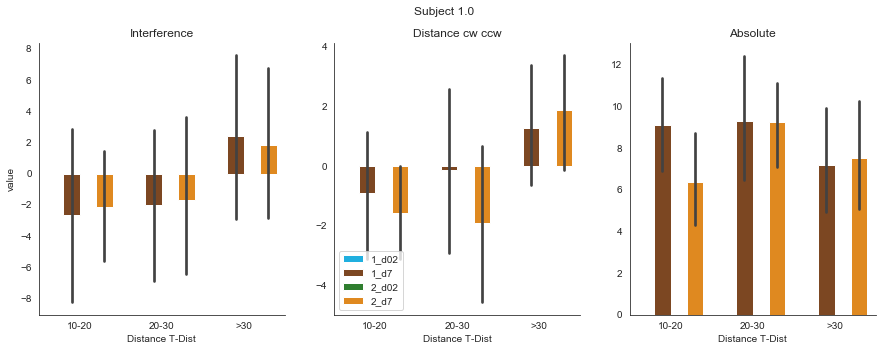

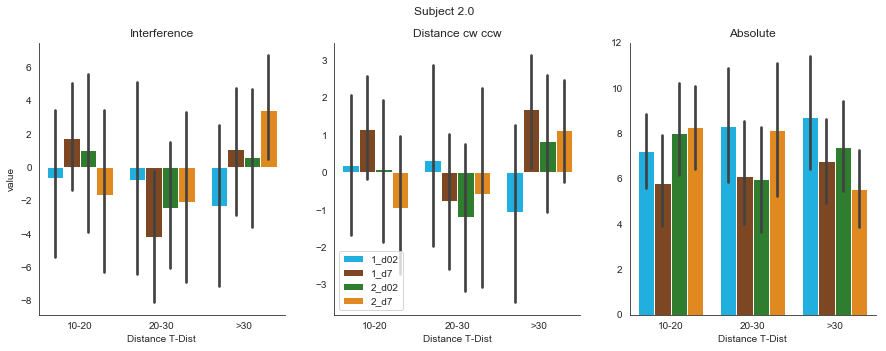

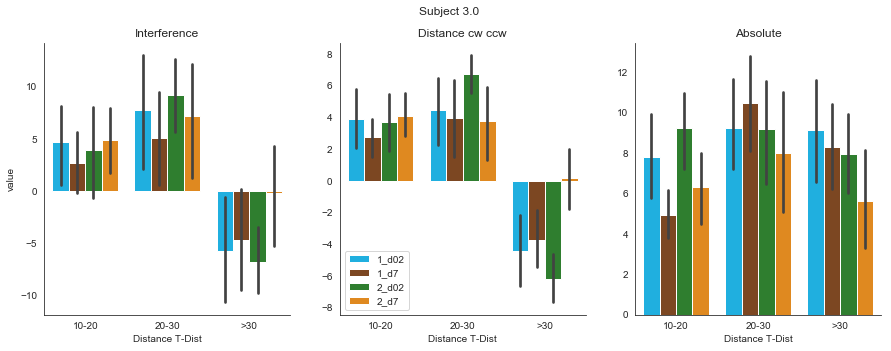

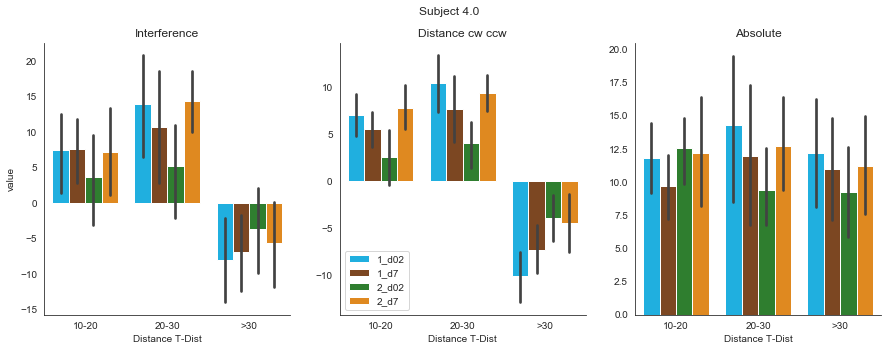

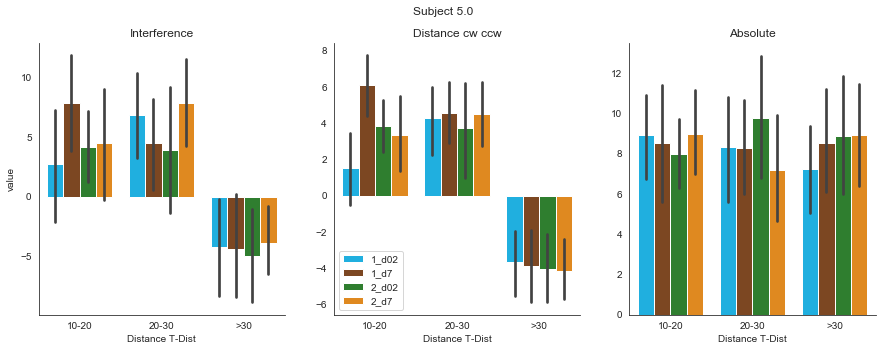

...

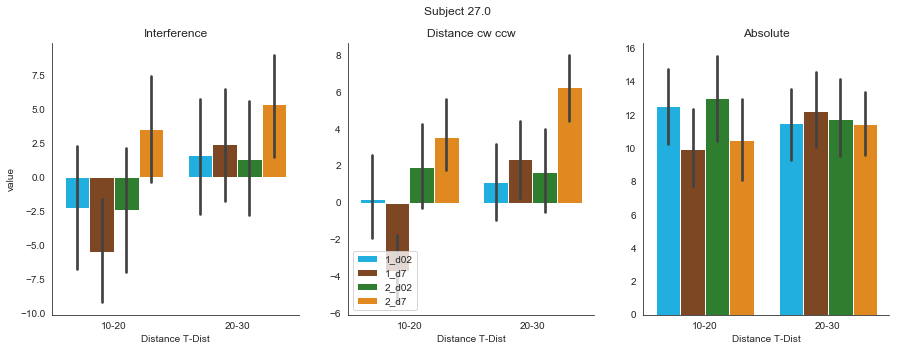

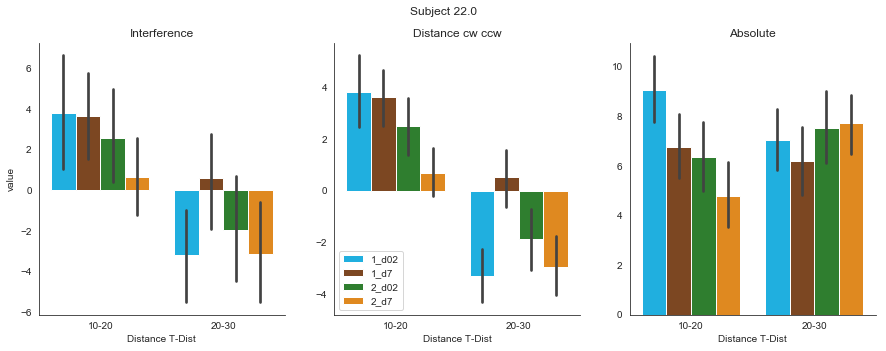

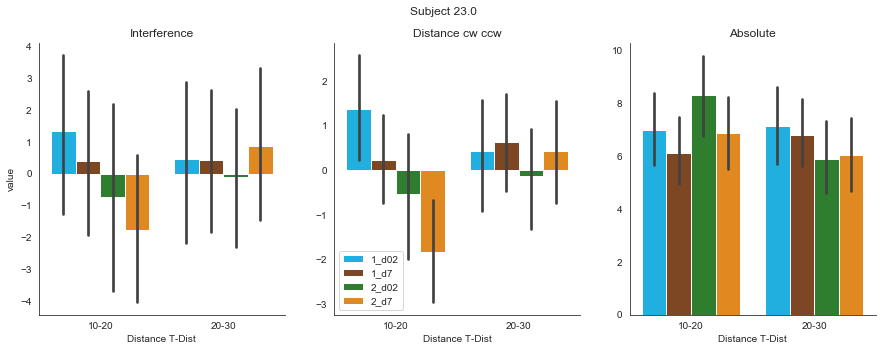

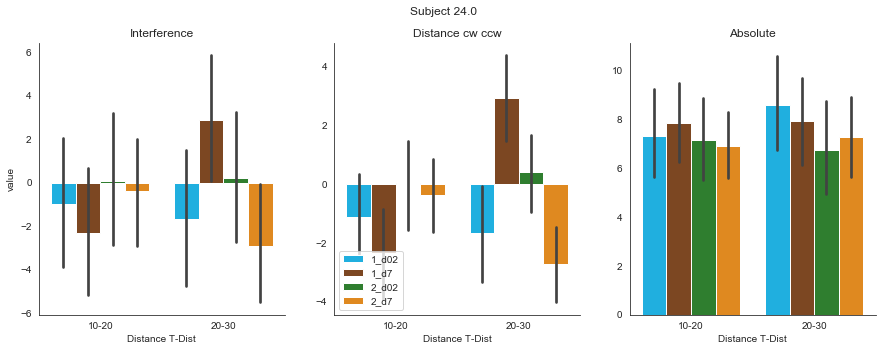

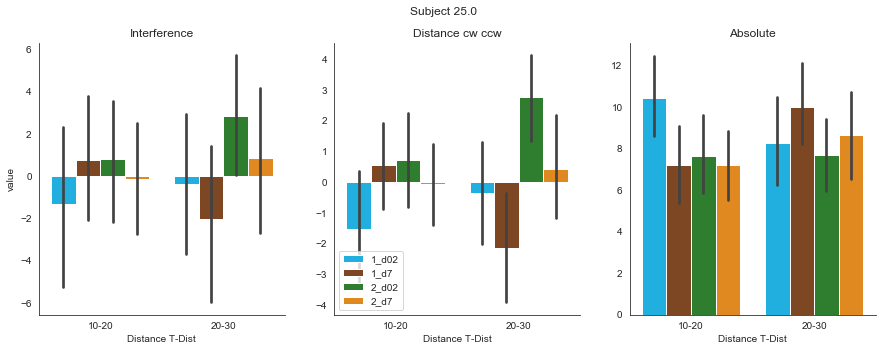

In [21]:
### SUBJECT BY SUBJECT

for SUBJ in df_analysis.subject.unique():
    df_subj = df_analysis.loc[df_analysis['subject']==SUBJ]
    #Plot of errors
    fig = plt.figure()
    fig.set_size_inches(15, 5)
    fig.tight_layout()
    fig.suptitle('Subject ' +str(SUBJ))
    ax1 = fig.add_subplot(131)
    ax2 = fig.add_subplot(132)
    ax3 = fig.add_subplot(133)
    sns.barplot(ax=ax1, x="type", y="Interference", hue='ord_del_cond', hue_order=['1_d02',  '1_d7', '2_d02', '2_d7'], 
                data=df_subj, palette=['deepskyblue', 'saddlebrown', 'forestgreen','darkorange'])

    sns.barplot(ax=ax2, x="type", y="distance_A_err", hue='ord_del_cond', hue_order=['1_d02',  '1_d7', '2_d02', '2_d7'],
                data=df_subj, palette=['deepskyblue', 'saddlebrown', 'forestgreen','darkorange'])

    sns.barplot( ax=ax3, x="type", y="A_err_abs", hue='ord_del_cond', hue_order=['1_d02',  '1_d7', '2_d02', '2_d7'],
                data=df_subj, palette=['deepskyblue', 'saddlebrown', 'forestgreen','darkorange'])



    axes=[ax1, ax2, ax3]
    Titles=['Interference', 'Distance cw ccw', 'Absolute']

    for i, Ax in enumerate(axes):
        Ax.spines['right'].set_visible(False)
        Ax.spines['top'].set_visible(False)
        Ax.title.set_text(Titles[i])
        Ax.legend_.remove()
        Ax.set_xticklabels(['10-20','20-30', '>30'])
        Ax.set_xlabel('Distance T-Dist')
        Ax.set_ylabel('')


    ax2.legend(loc=3)
    ax1.set_ylabel('value')
    plt.show()





C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


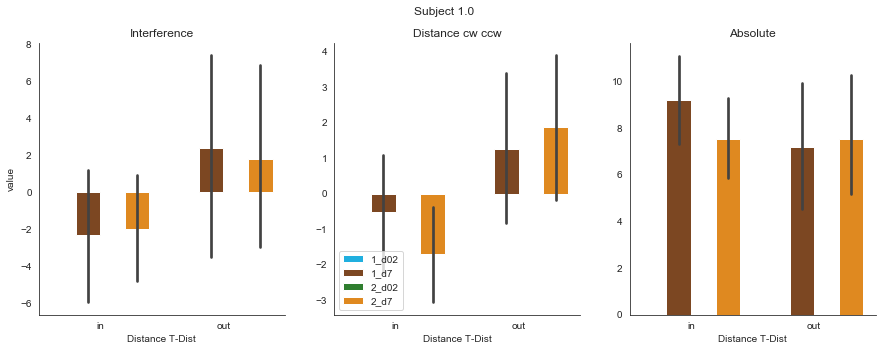

Precision 1.0 = 8.028
Interference 1.0 = -0.816
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.080
Model:                            OLS   Adj. R-squared:                  0.053
Method:                 Least Squares   F-statistic:                     2.994
Date:                Thu, 04 Apr 2019   Prob (F-statistic):             0.0343
Time:                        12:07:05   Log-Likelihood:                -316.54
No. Observations:                 107   AIC:                             641.1
Df Residuals:                     103   BIC:                             651.8
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

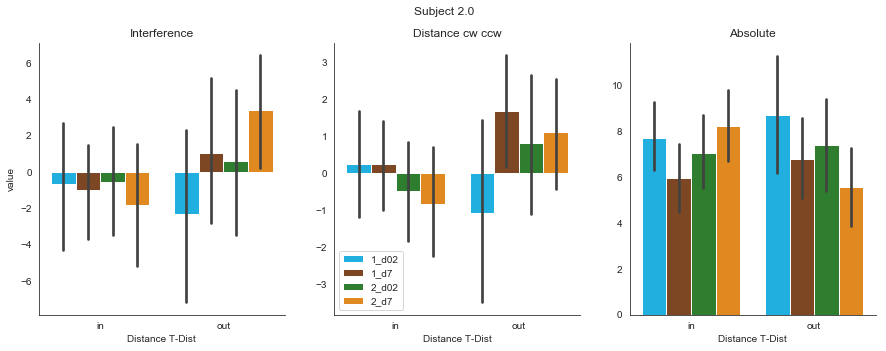

Precision 2.0 = 7.174
Interference 2.0 = -0.425
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.038
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     1.176
Date:                Thu, 04 Apr 2019   Prob (F-statistic):              0.318
Time:                        12:07:07   Log-Likelihood:                -619.96
No. Observations:                 218   AIC:                             1256.
Df Residuals:                     210   BIC:                             1283.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

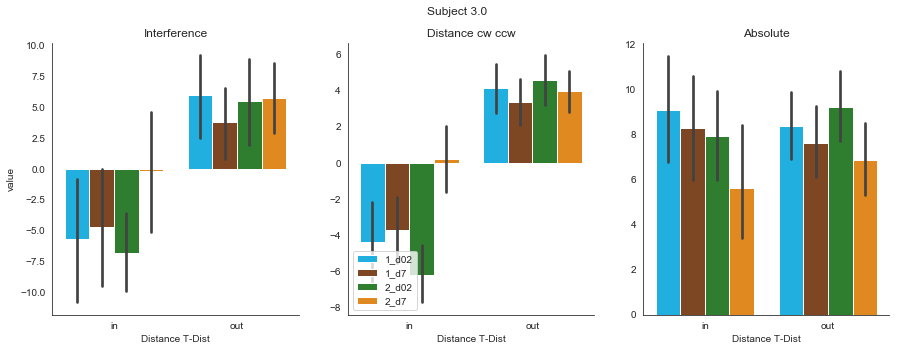

Precision 3.0 = 7.949
Interference 3.0 = 2.098
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.459
Model:                            OLS   Adj. R-squared:                  0.440
Method:                 Least Squares   F-statistic:                     25.28
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           7.42e-25
Time:                        12:07:08   Log-Likelihood:                -615.88
No. Observations:                 217   AIC:                             1248.
Df Residuals:                     209   BIC:                             1275.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------

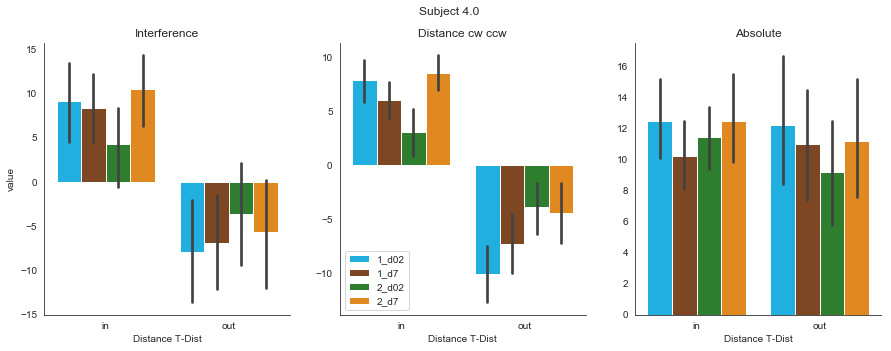

Precision 4.0 = 11.41
Interference 4.0 = 3.363
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.560
Model:                            OLS   Adj. R-squared:                  0.546
Method:                 Least Squares   F-statistic:                     38.05
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           4.25e-34
Time:                        12:07:09   Log-Likelihood:                -686.56
No. Observations:                 217   AIC:                             1389.
Df Residuals:                     209   BIC:                             1416.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------

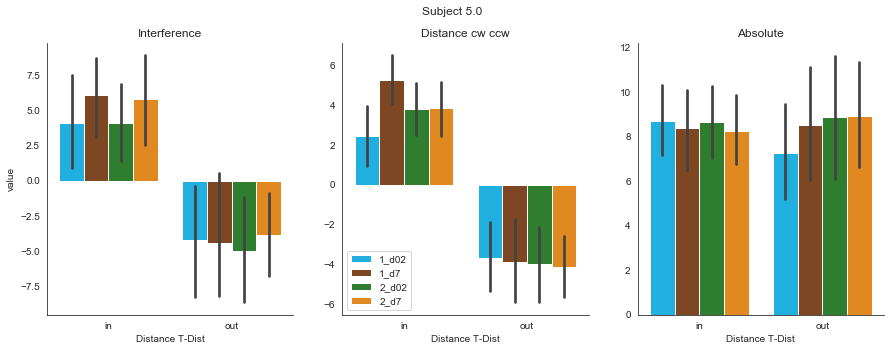

Precision 5.0 = 8.464
Interference 5.0 = 1.907
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.443
Model:                            OLS   Adj. R-squared:                  0.425
Method:                 Least Squares   F-statistic:                     24.11
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           5.39e-24
Time:                        12:07:11   Log-Likelihood:                -627.65
No. Observations:                 220   AIC:                             1271.
Df Residuals:                     212   BIC:                             1298.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------

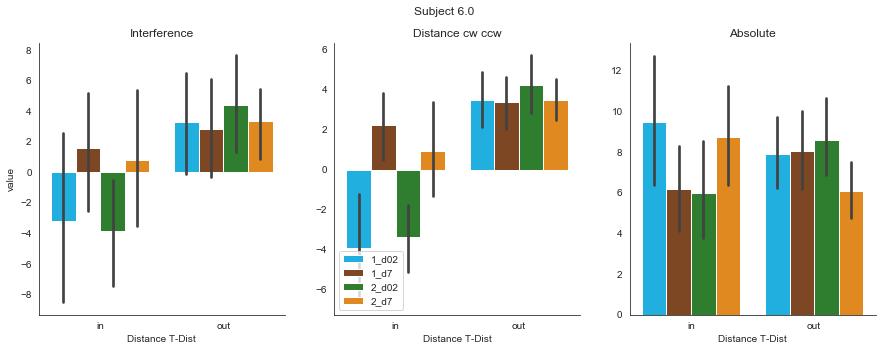

Precision 6.0 = 7.653
Interference 6.0 = 1.932
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.277
Model:                            OLS   Adj. R-squared:                  0.254
Method:                 Least Squares   F-statistic:                     11.73
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           1.29e-12
Time:                        12:07:12   Log-Likelihood:                -640.32
No. Observations:                 222   AIC:                             1297.
Df Residuals:                     214   BIC:                             1324.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------

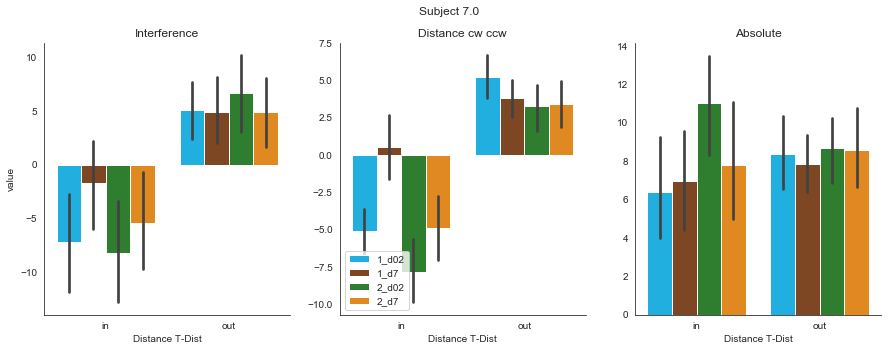

Precision 7.0 = 8.276
Interference 7.0 = 1.705
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.488
Model:                            OLS   Adj. R-squared:                  0.471
Method:                 Least Squares   F-statistic:                     28.09
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           6.07e-27
Time:                        12:07:14   Log-Likelihood:                -623.45
No. Observations:                 214   AIC:                             1263.
Df Residuals:                     206   BIC:                             1290.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------

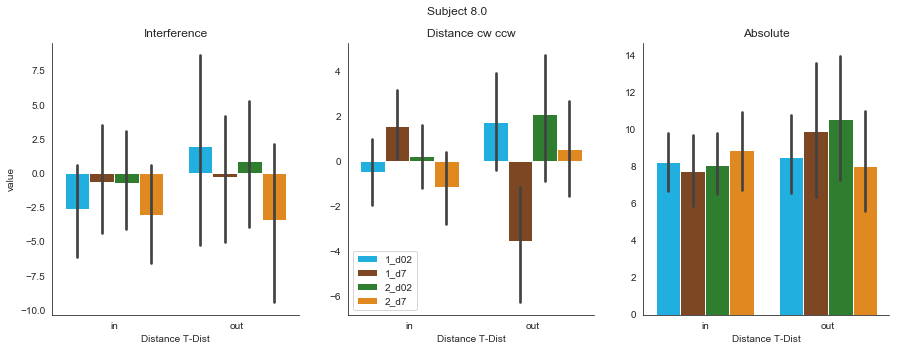

Precision 8.0 = 8.571
Interference 8.0 = -1.182
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.090
Model:                            OLS   Adj. R-squared:                  0.059
Method:                 Least Squares   F-statistic:                     2.938
Date:                Thu, 04 Apr 2019   Prob (F-statistic):            0.00591
Time:                        12:07:15   Log-Likelihood:                -654.67
No. Observations:                 217   AIC:                             1325.
Df Residuals:                     209   BIC:                             1352.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

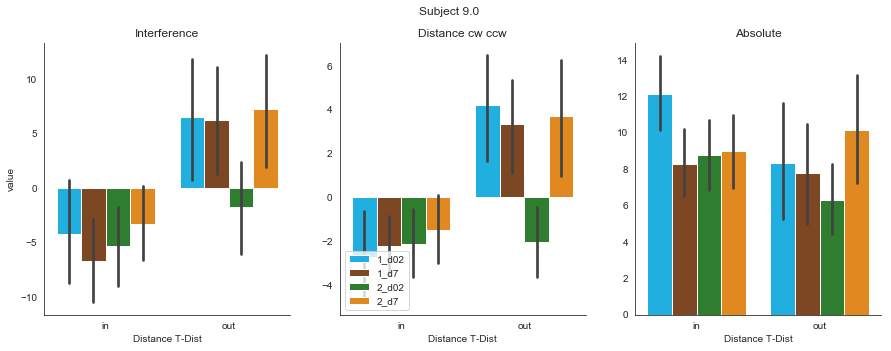

Precision 9.0 = 9.076
Interference 9.0 = -1.895
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.199
Model:                            OLS   Adj. R-squared:                  0.173
Method:                 Least Squares   F-statistic:                     7.643
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           3.09e-08
Time:                        12:07:17   Log-Likelihood:                -678.54
No. Observations:                 223   AIC:                             1373.
Df Residuals:                     215   BIC:                             1400.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

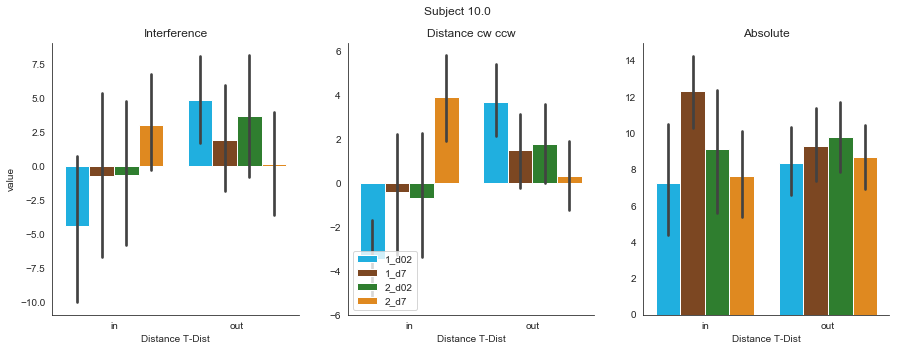

Precision 10.0 = 9.063
Interference 10.0 = 1.591
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.130
Model:                            OLS   Adj. R-squared:                  0.101
Method:                 Least Squares   F-statistic:                     4.549
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           9.41e-05
Time:                        12:07:18   Log-Likelihood:                -679.15
No. Observations:                 221   AIC:                             1374.
Df Residuals:                     213   BIC:                             1401.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

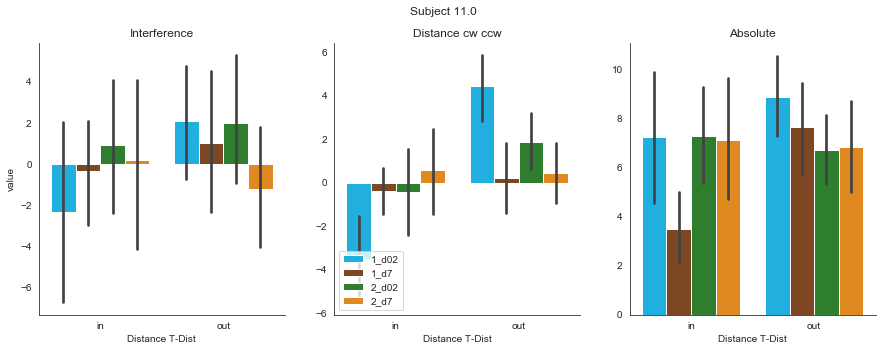

Precision 11.0 = 7.097
Interference 11.0 = 0.495
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.194
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     7.182
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           1.06e-07
Time:                        12:07:20   Log-Likelihood:                -621.12
No. Observations:                 217   AIC:                             1258.
Df Residuals:                     209   BIC:                             1285.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

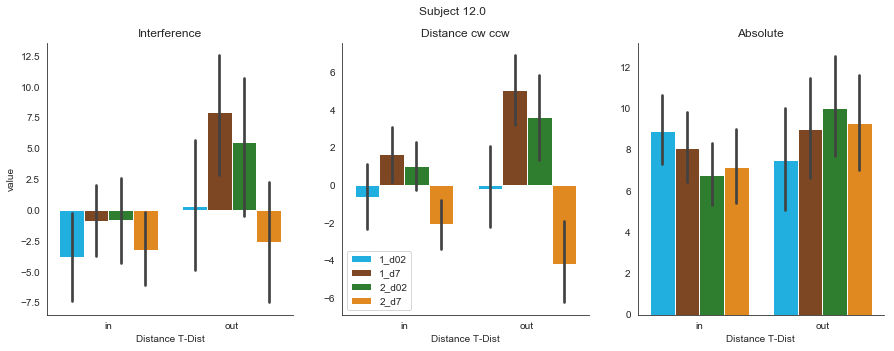

Precision 12.0 = 8.128
Interference 12.0 = -0.493
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.229
Model:                            OLS   Adj. R-squared:                  0.203
Method:                 Least Squares   F-statistic:                     8.955
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           1.18e-09
Time:                        12:07:21   Log-Likelihood:                -643.22
No. Observations:                 219   AIC:                             1302.
Df Residuals:                     211   BIC:                             1330.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------

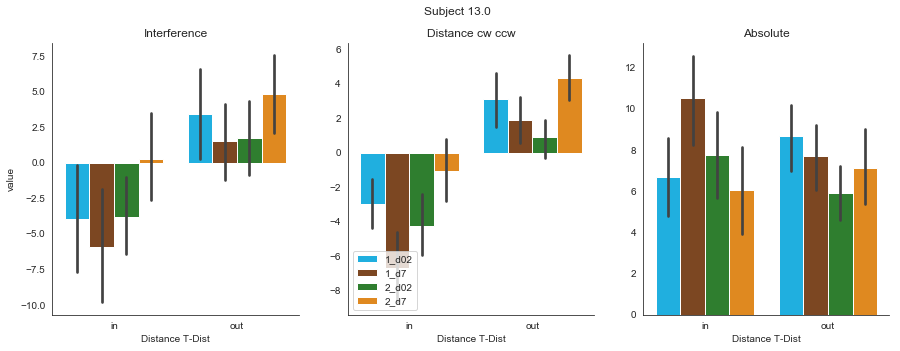

Precision 13.0 = 7.5
Interference 13.0 = 0.698
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.411
Model:                            OLS   Adj. R-squared:                  0.391
Method:                 Least Squares   F-statistic:                     21.11
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           1.84e-21
Time:                        12:07:23   Log-Likelihood:                -622.78
No. Observations:                 220   AIC:                             1262.
Df Residuals:                     212   BIC:                             1289.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------

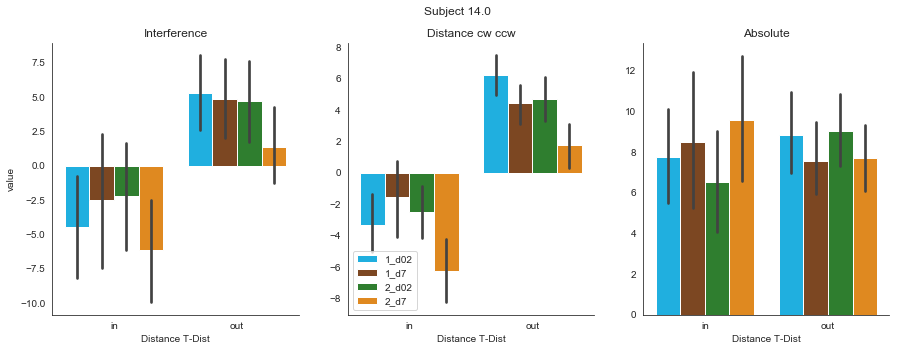

Precision 14.0 = 8.209
Interference 14.0 = 1.413
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.456
Model:                            OLS   Adj. R-squared:                  0.438
Method:                 Least Squares   F-statistic:                     25.36
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           5.22e-25
Time:                        12:07:24   Log-Likelihood:                -634.33
No. Observations:                 220   AIC:                             1285.
Df Residuals:                     212   BIC:                             1312.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

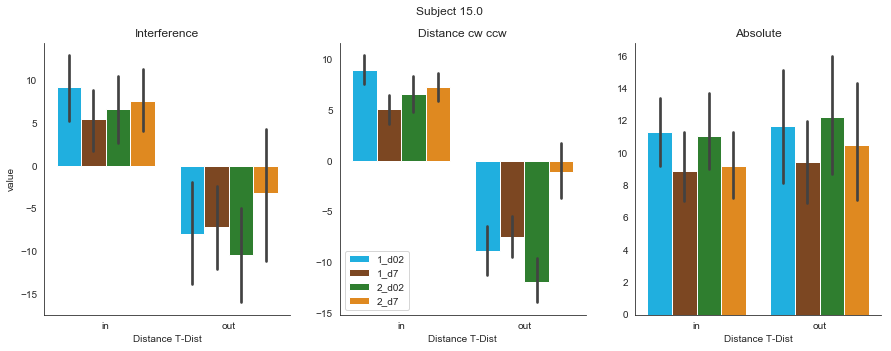

Precision 15.0 = 10.432
Interference 15.0 = 2.434
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.692
Model:                            OLS   Adj. R-squared:                  0.682
Method:                 Least Squares   F-statistic:                     68.65
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           2.92e-51
Time:                        12:07:25   Log-Likelihood:                -669.14
No. Observations:                 222   AIC:                             1354.
Df Residuals:                     214   BIC:                             1381.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------

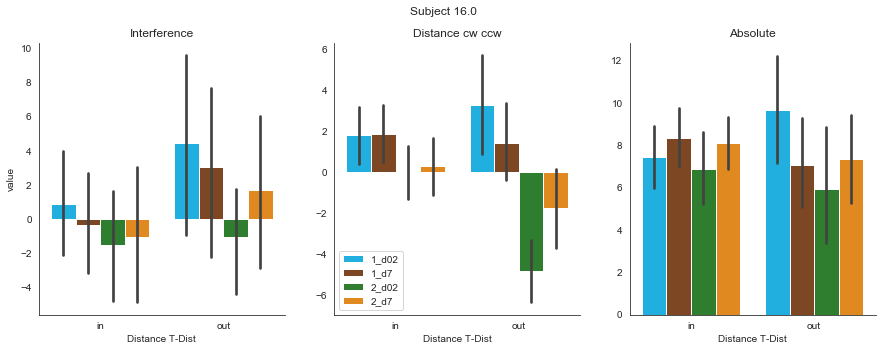

Precision 16.0 = 7.647
Interference 16.0 = 0.364
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.178
Model:                            OLS   Adj. R-squared:                  0.151
Method:                 Least Squares   F-statistic:                     6.601
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           4.56e-07
Time:                        12:07:27   Log-Likelihood:                -635.48
No. Observations:                 221   AIC:                             1287.
Df Residuals:                     213   BIC:                             1314.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

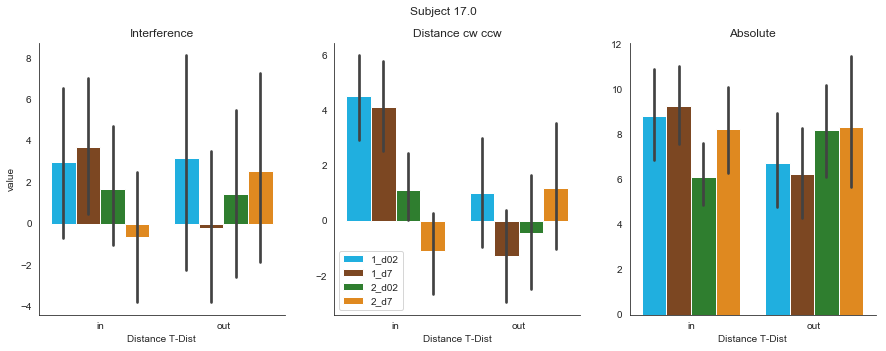

Precision 17.0 = 7.845
Interference 17.0 = 1.82
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.197
Model:                            OLS   Adj. R-squared:                  0.171
Method:                 Least Squares   F-statistic:                     7.401
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           5.93e-08
Time:                        12:07:28   Log-Likelihood:                -638.43
No. Observations:                 219   AIC:                             1293.
Df Residuals:                     211   BIC:                             1320.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

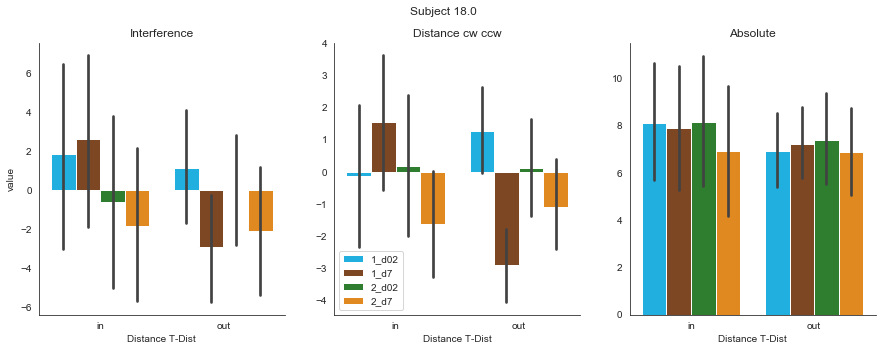

Precision 18.0 = 7.323
Interference 18.0 = -0.484
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.107
Model:                            OLS   Adj. R-squared:                  0.078
Method:                 Least Squares   F-statistic:                     3.645
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           0.000980
Time:                        12:07:30   Log-Likelihood:                -631.92
No. Observations:                 220   AIC:                             1280.
Df Residuals:                     212   BIC:                             1307.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------

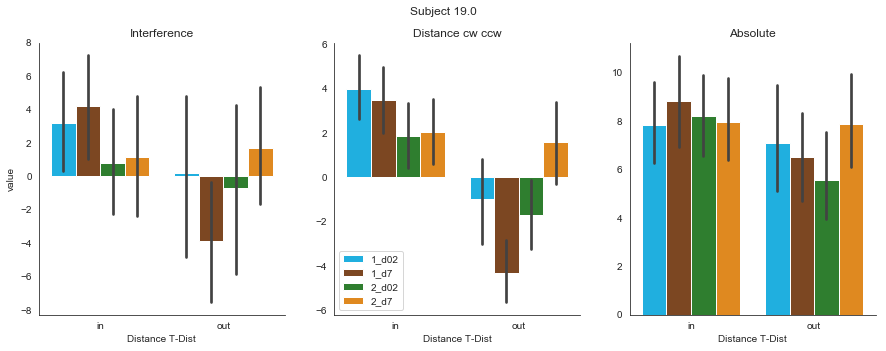

Precision 19.0 = 7.759
Interference 19.0 = 1.352
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.240
Model:                            OLS   Adj. R-squared:                  0.215
Method:                 Least Squares   F-statistic:                     9.553
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           2.63e-10
Time:                        12:07:31   Log-Likelihood:                -636.25
No. Observations:                 220   AIC:                             1288.
Df Residuals:                     212   BIC:                             1316.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

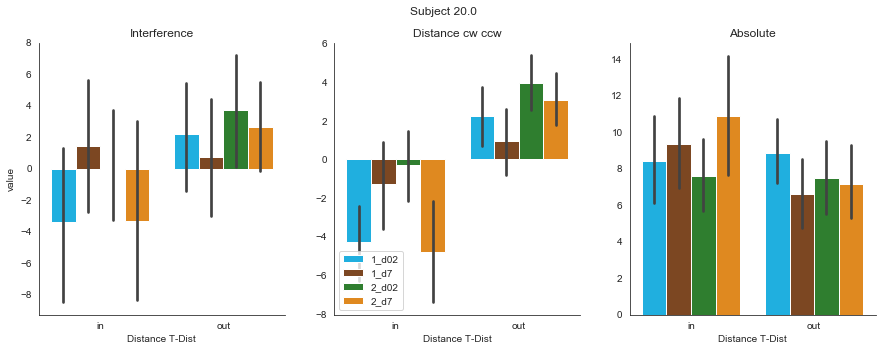

Precision 20.0 = 8.182
Interference 20.0 = 0.979
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.290
Model:                            OLS   Adj. R-squared:                  0.264
Method:                 Least Squares   F-statistic:                     11.35
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           4.73e-12
Time:                        12:07:32   Log-Likelihood:                -599.31
No. Observations:                 203   AIC:                             1215.
Df Residuals:                     195   BIC:                             1241.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

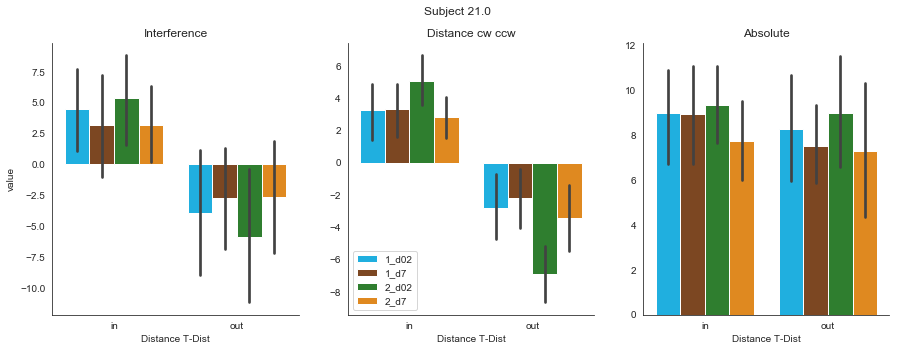

Precision 21.0 = 8.482
Interference 21.0 = 1.373
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.401
Model:                            OLS   Adj. R-squared:                  0.382
Method:                 Least Squares   F-statistic:                     20.12
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           1.47e-20
Time:                        12:07:34   Log-Likelihood:                -641.64
No. Observations:                 218   AIC:                             1299.
Df Residuals:                     210   BIC:                             1326.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

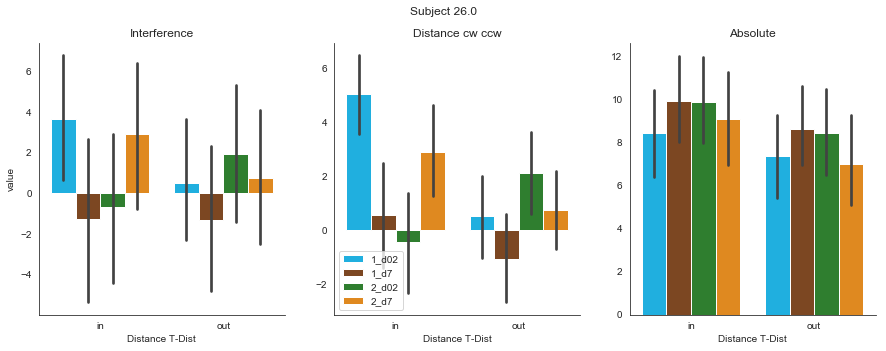

Precision 26.0 = 8.548
Interference 26.0 = 0.901
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.123
Model:                            OLS   Adj. R-squared:                  0.100
Method:                 Least Squares   F-statistic:                     5.298
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           1.11e-05
Time:                        12:07:35   Log-Likelihood:                -821.82
No. Observations:                 272   AIC:                             1660.
Df Residuals:                     264   BIC:                             1688.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

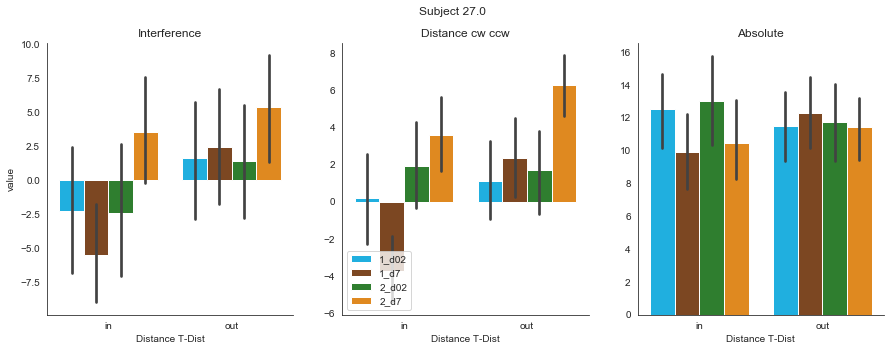

Precision 27.0 = 11.662
Interference 27.0 = 0.63
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.128
Model:                            OLS   Adj. R-squared:                  0.108
Method:                 Least Squares   F-statistic:                     6.315
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           6.28e-07
Time:                        12:07:37   Log-Likelihood:                -1019.8
No. Observations:                 308   AIC:                             2056.
Df Residuals:                     300   BIC:                             2086.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

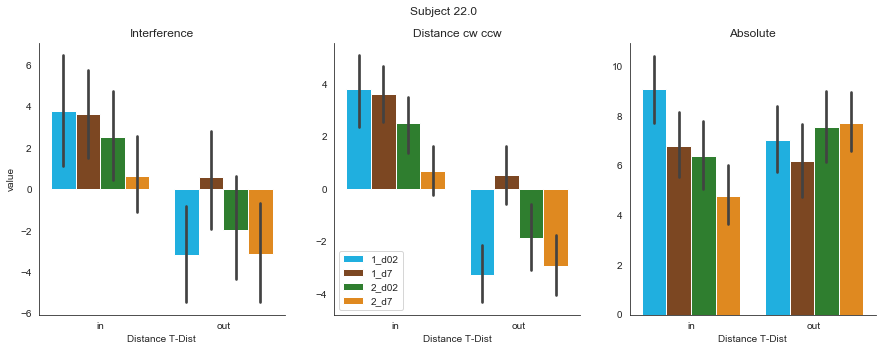

Precision 22.0 = 6.944
Interference 22.0 = 0.395
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.320
Model:                            OLS   Adj. R-squared:                  0.306
Method:                 Least Squares   F-statistic:                     23.25
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           7.92e-26
Time:                        12:07:38   Log-Likelihood:                -982.68
No. Observations:                 354   AIC:                             1981.
Df Residuals:                     346   BIC:                             2012.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

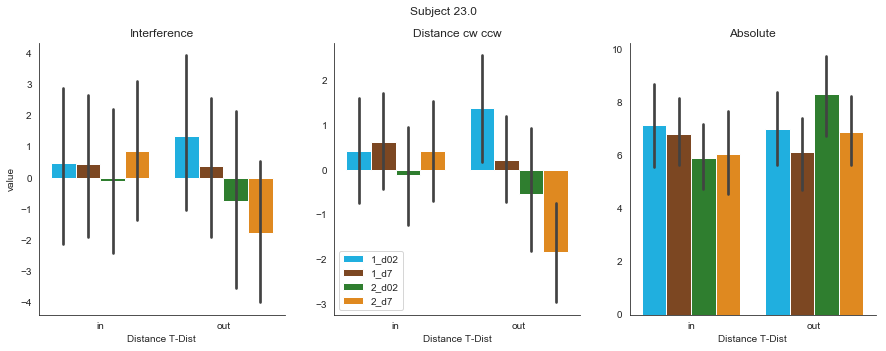

Precision 23.0 = 6.794
Interference 23.0 = 0.099
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.047
Model:                            OLS   Adj. R-squared:                  0.028
Method:                 Least Squares   F-statistic:                     2.456
Date:                Thu, 04 Apr 2019   Prob (F-statistic):             0.0180
Time:                        12:07:40   Log-Likelihood:                -993.00
No. Observations:                 354   AIC:                             2002.
Df Residuals:                     346   BIC:                             2033.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

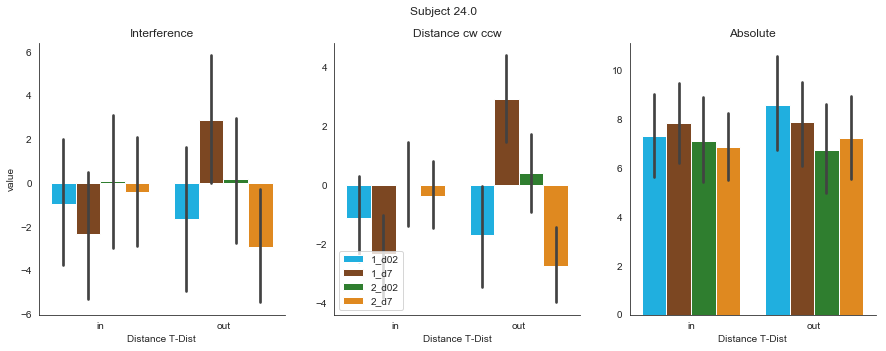

Precision 24.0 = 7.452
Interference 24.0 = -0.65
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.130
Model:                            OLS   Adj. R-squared:                  0.109
Method:                 Least Squares   F-statistic:                     6.112
Date:                Thu, 04 Apr 2019   Prob (F-statistic):           1.15e-06
Time:                        12:07:41   Log-Likelihood:                -854.48
No. Observations:                 294   AIC:                             1725.
Df Residuals:                     286   BIC:                             1754.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

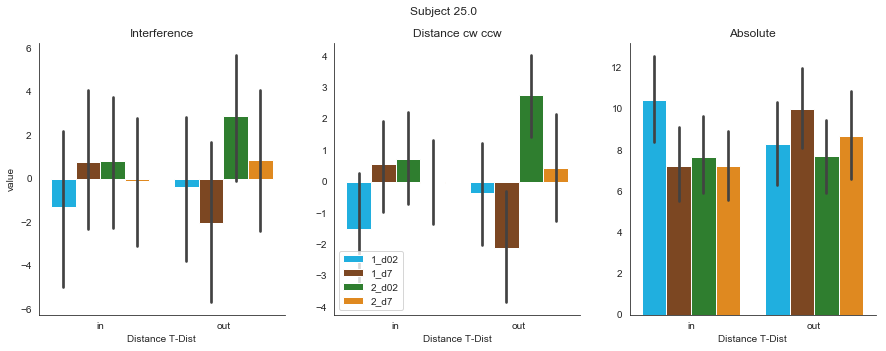

Precision 25.0 = 8.39
Interference 25.0 = 0.18
                            OLS Regression Results                            
Dep. Variable:         distance_A_err   R-squared:                       0.072
Model:                            OLS   Adj. R-squared:                  0.051
Method:                 Least Squares   F-statistic:                     3.316
Date:                Thu, 04 Apr 2019   Prob (F-statistic):            0.00205
Time:                        12:07:43   Log-Likelihood:                -925.02
No. Observations:                 305   AIC:                             1866.
Df Residuals:                     297   BIC:                             1896.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------

In [22]:
### SUBJECT BY SUBJECT

for SUBJ in df_analysis.subject.unique():
    df_subj = df_analysis.loc[df_analysis['subject']==SUBJ]
    #Plot of errors
    fig = plt.figure()
    fig.set_size_inches(15, 5)
    fig.tight_layout()
    fig.suptitle('Subject ' +str(SUBJ))
    ax1 = fig.add_subplot(131)
    ax2 = fig.add_subplot(132)
    ax3 = fig.add_subplot(133)
    sns.barplot(ax=ax1, x="dist_in_out", y="Interference", hue='ord_del_cond', hue_order=['1_d02',  '1_d7', '2_d02', '2_d7'], 
                data=df_subj, palette=['deepskyblue', 'saddlebrown', 'forestgreen','darkorange'])

    sns.barplot(ax=ax2, x="dist_in_out", y="distance_A_err", hue='ord_del_cond', hue_order=['1_d02',  '1_d7', '2_d02', '2_d7'],
                data=df_subj, palette=['deepskyblue', 'saddlebrown', 'forestgreen','darkorange'])

    sns.barplot( ax=ax3, x="dist_in_out", y="A_err_abs", hue='ord_del_cond', hue_order=['1_d02',  '1_d7', '2_d02', '2_d7'],
                data=df_subj, palette=['deepskyblue', 'saddlebrown', 'forestgreen','darkorange'])



    axes=[ax1, ax2, ax3]
    Titles=['Interference', 'Distance cw ccw', 'Absolute']

    for i, Ax in enumerate(axes):
        Ax.spines['right'].set_visible(False)
        Ax.spines['top'].set_visible(False)
        Ax.title.set_text(Titles[i])
        Ax.legend_.remove()
        Ax.set_xticklabels(['in','out'])
        Ax.set_xlabel('Distance T-Dist')
        Ax.set_ylabel('')


    ax2.legend(loc=3)
    ax1.set_ylabel('value')
    plt.show()
    
    Precision = round(df_subj.A_err_abs.mean(), 3)
    Interference = round(df_subj.Interference.mean(), 3)
    print( 'Precision ' + str(SUBJ) +  ' = ' + str(Precision))
    print( 'Interference ' + str(SUBJ) +  ' = ' + str(Interference))
    result = smf.ols(formula="distance_A_err ~ delay*order*dist_in_out ", data=df_subj).fit()
    print(result.summary())



Distribution of distances

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


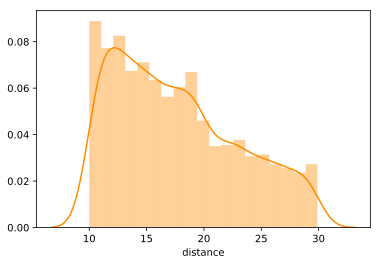

10.0 29.9


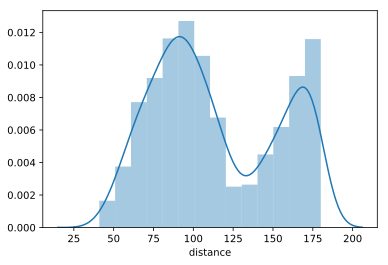

41.0 180.0


In [6]:
d_in = df_analysis.loc[df_analysis['dist_in_out']=='in']
sns.distplot(d_in.distance, color = orange)
plt.show()
print( min(d_in.distance), max(d_in.distance) )


d_out = df_analysis.loc[df_analysis['dist_in_out']=='out']
sns.distplot(d_out.distance)
plt.show()
print( min(d_out.distance), max(d_out.distance) )

In [7]:
df_analysis.columns

Index(['A_err', 'Interference', 'A_R', 'A_err_abs', 'delay', 'distance',
       'subject', 'order', 'cond', 'type', 'A_dist', 'A_T',
       'A_err_int_theoretical', 'A_res', 'A_err_theoretical', 'environment',
       'cw_ccw', 'Interference_col', 'sex', 'dist_in_out', 'ord_del_cond',
       'distance_A_err'],
      dtype='object')

In [18]:
result = smf.mixedlm(formula="distance_A_err ~ delay*order*type",
                     data=df_analysis.loc[df_analysis['environment']=='psychophysics'], groups='subject').fit()
print(result.summary())


result = smf.mixedlm(formula="distance_A_err ~ delay*order*type",
                     data=df_analysis.loc[df_analysis['environment']=='fMRI'], groups='subject').fit()
print(result.summary())


result = smf.mixedlm(formula="distance_A_err ~ delay*order*type",
                     data=df_analysis, groups='subject').fit()
print(result.summary())


result = smf.mixedlm(formula="distance_A_err ~ delay*order+ delay*type + type*order",
                     data=df_analysis, groups='subject').fit()
print(result.summary())

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\David\Anaconda3\envs\python3\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\David\Anaconda3\envs\python3\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\David\Anaconda3\envs\python3\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\David\Anaconda3\envs\python3\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likel

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: distance_A_err
No. Observations: 4475    Method:             REML          
No. Groups:       21      Scale:              30.7122       
Min. group size:  107     Likelihood:         -14076.0321   
Max. group size:  223     Converged:          No            
Mean group size:  213.1                                     
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept          7.995    1.544  5.180 0.000  4.970 11.021
delay             -0.369    0.191 -1.939 0.052 -0.743  0.004
order             -1.247    0.606 -2.057 0.040 -2.435 -0.059
delay:order        0.001    0.121  0.007 0.994 -0.236  0.238
type              -3.166    0.454 -6.970 0.000 -4.057 -2.276
delay:type         0.153    0.090  1.699 0.089 -0.023  0.330
order:type         0.298    0.287  1

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


                  Mixed Linear Model Regression Results
Model:                 MixedLM     Dependent Variable:     distance_A_err
No. Observations:      6362        Method:                 REML          
No. Groups:            27          Scale:                  29.8416       
Min. group size:       107         Likelihood:             -19861.1832   
Max. group size:       354         Converged:              Yes           
Mean group size:       235.6                                             
-------------------------------------------------------------------------
                               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------------
Intercept                       3.566    0.433  8.234 0.000  2.717  4.415
dist_in_out[T.out]             -5.716    0.655 -8.724 0.000 -7.001 -4.432
delay                          -0.205    0.081 -2.511 0.012 -0.364 -0.045
delay:dist_in_out[T.out]        0.429    0.131  3.273 0.

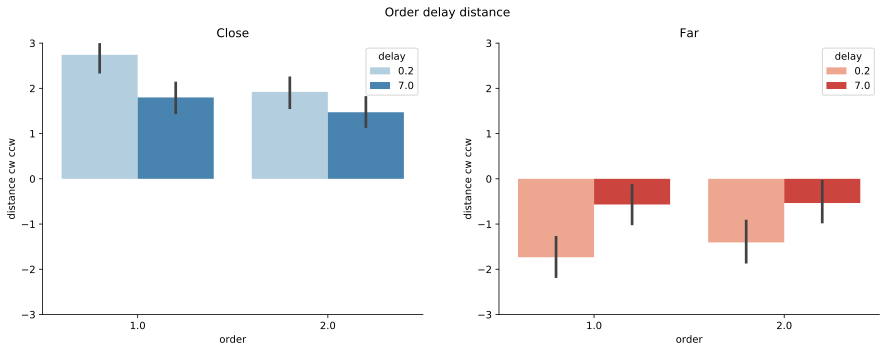

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


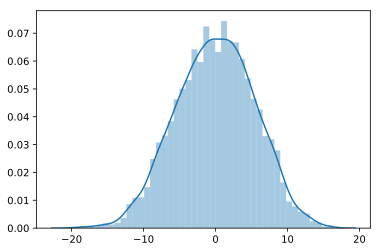

AndersonResult(statistic=2.291382277122466, critical_values=array([0.576, 0.656, 0.787, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
(0.9984428286552429, 6.223572199814953e-06)


C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\morestats.py:1309: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: distance_A_err
No. Observations: 3920    Method:             REML          
No. Groups:       27      Scale:              24.6319       
Min. group size:  73      Likelihood:         -11892.1499   
Max. group size:  181     Converged:          Yes           
Mean group size:  145.2                                     
-------------------------------------------------------------
              Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
-------------------------------------------------------------
Intercept      3.468     0.570   6.083  0.000   2.351   4.586
delay         -0.199     0.074  -2.684  0.007  -0.344  -0.054
order         -0.799     0.234  -3.418  0.001  -1.257  -0.341
delay:order    0.075     0.047   1.599  0.110  -0.017   0.166
subject Var    5.070     0.294                               

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Var

In [8]:
#### ALL TOGETHER SUMMARY

fig = plt.figure()
fig.set_size_inches(15, 5)
fig.tight_layout()
fig.suptitle('Order delay distance')
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
sns.barplot( ax= ax1, x="order", y="distance_A_err", hue='delay', data=df_analysis.loc[df_analysis['dist_in_out']=='in'], palette='Blues')
sns.barplot( ax= ax2, x="order", y="distance_A_err", hue='delay', data=df_analysis.loc[df_analysis['dist_in_out']=='out'], palette='Reds')
axes=[ax1, ax2]
Titles=['Close', 'Far']

for i, Ax in enumerate(axes):
    Ax.spines['right'].set_visible(False)
    Ax.spines['top'].set_visible(False)
    Ax.title.set_text(Titles[i])
    #Ax.legend_.remove()
    #Ax.set_xticklabels(['in','out'])
    #Ax.set_xlabel('Distance T-Dist')
    Ax.set_ylabel('distance cw ccw')
    Ax.set_ylim(-3,3)

    
    
result = smf.mixedlm(formula="distance_A_err ~ delay*order*dist_in_out ", data=df_analysis, groups='subject').fit()
print(result.summary())

plt.show()

#Are the residuals normally distributed?
sns.distplot(result.resid)
plt.show()
#Residuals distribution
print(scipy.stats.anderson(x=result.resid, dist='norm'))
#Residuals distribution
print(scipy.stats.shapiro(result.resid))



# result = smf.mixedlm(formula="distance_A_err ~ delay*order + delay*dist_in_out + order*dist_in_out ", data=df_analysis, groups='subject').fit()
# print(result.summary())


result = smf.mixedlm(formula="distance_A_err ~ delay*order ", data=df_analysis.loc[ df_analysis['dist_in_out']=='in'], groups='subject').fit()
print(result.summary())


result = smf.mixedlm(formula="distance_A_err ~ delay*order ", data=df_analysis.loc[df_analysis['dist_in_out']=='out'], groups='subject').fit()
print(result.summary())


# result = smf.mixedlm(formula="distance_A_err ~ delay + order ", data=df_analysis.loc[ df_analysis['dist_in_out']=='in'], groups='subject').fit()
# print(result.summary())


# result = smf.mixedlm(formula="distance_A_err ~ delay + order ", data=df_analysis.loc[df_analysis['dist_in_out']=='out'], groups='subject').fit()
# print(result.summary())




C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


                  Mixed Linear Model Regression Results
Model:                 MixedLM     Dependent Variable:     distance_A_err
No. Observations:      6362        Method:                 REML          
No. Groups:            27          Scale:                  29.8416       
Min. group size:       107         Likelihood:             -19861.1832   
Max. group size:       354         Converged:              Yes           
Mean group size:       235.6                                             
-------------------------------------------------------------------------
                               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------------
Intercept                       3.566    0.433  8.234 0.000  2.717  4.415
dist_in_out[T.out]             -5.716    0.655 -8.724 0.000 -7.001 -4.432
delay                          -0.205    0.081 -2.511 0.012 -0.364 -0.045
delay:dist_in_out[T.out]        0.429    0.131  3.273 0.

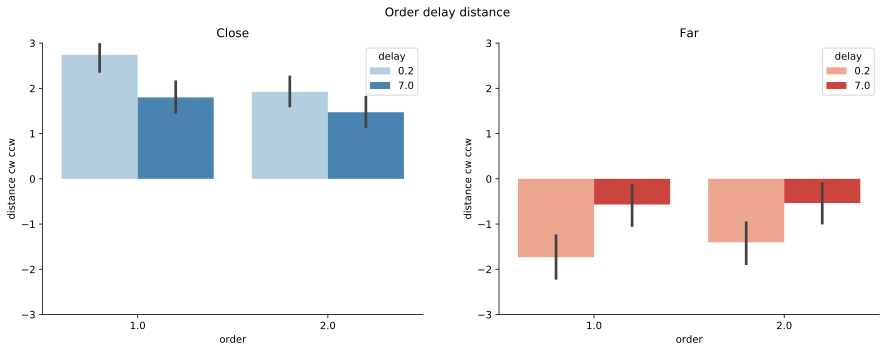

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


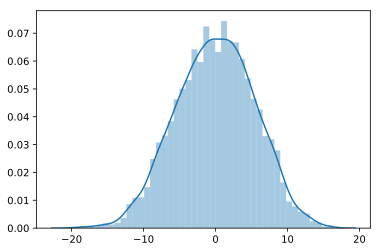

AndersonResult(statistic=2.291382277122466, critical_values=array([0.576, 0.656, 0.787, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
(0.9984428286552429, 6.223572199814953e-06)


C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\morestats.py:1309: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: distance_A_err
No. Observations: 3920    Method:             REML          
No. Groups:       27      Scale:              24.6319       
Min. group size:  73      Likelihood:         -11892.1499   
Max. group size:  181     Converged:          Yes           
Mean group size:  145.2                                     
-------------------------------------------------------------
              Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
-------------------------------------------------------------
Intercept      3.468     0.570   6.083  0.000   2.351   4.586
delay         -0.199     0.074  -2.684  0.007  -0.344  -0.054
order         -0.799     0.234  -3.418  0.001  -1.257  -0.341
delay:order    0.075     0.047   1.599  0.110  -0.017   0.166
subject Var    5.070     0.294                               

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Var

In [9]:
#### ALL TOGETHER SUMMARY

fig = plt.figure()
fig.set_size_inches(15, 5)
fig.tight_layout()
fig.suptitle('Order delay distance')
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
sns.barplot( ax= ax1, x="order", y="distance_A_err", hue='delay', data=df_analysis.loc[df_analysis['dist_in_out']=='in'], palette='Blues')
sns.barplot( ax= ax2, x="order", y="distance_A_err", hue='delay', data=df_analysis.loc[df_analysis['dist_in_out']=='out'], palette='Reds')
axes=[ax1, ax2]
Titles=['Close', 'Far']

for i, Ax in enumerate(axes):
    Ax.spines['right'].set_visible(False)
    Ax.spines['top'].set_visible(False)
    Ax.title.set_text(Titles[i])
    #Ax.legend_.remove()
    #Ax.set_xticklabels(['in','out'])
    #Ax.set_xlabel('Distance T-Dist')
    Ax.set_ylabel('distance cw ccw')
    Ax.set_ylim(-3,3)

    
    
result = smf.mixedlm(formula="distance_A_err ~ delay*order*dist_in_out ", data=df_analysis, groups='subject').fit()
print(result.summary())

plt.show()

#Are the residuals normally distributed?
sns.distplot(result.resid)
plt.show()
#Residuals distribution
print(scipy.stats.anderson(x=result.resid, dist='norm'))
#Residuals distribution
print(scipy.stats.shapiro(result.resid))



# result = smf.mixedlm(formula="distance_A_err ~ delay*order + delay*dist_in_out + order*dist_in_out ", data=df_analysis, groups='subject').fit()
# print(result.summary())


result = smf.mixedlm(formula="distance_A_err ~ delay*order ", data=df_analysis.loc[ df_analysis['dist_in_out']=='in'], groups='subject').fit()
print(result.summary())


result = smf.mixedlm(formula="distance_A_err ~ delay*order ", data=df_analysis.loc[df_analysis['dist_in_out']=='out'], groups='subject').fit()
print(result.summary())


# result = smf.mixedlm(formula="distance_A_err ~ delay + order ", data=df_analysis.loc[ df_analysis['dist_in_out']=='in'], groups='subject').fit()
# print(result.summary())


# result = smf.mixedlm(formula="distance_A_err ~ delay + order ", data=df_analysis.loc[df_analysis['dist_in_out']=='out'], groups='subject').fit()
# print(result.summary())




In [10]:
result = smf.mixedlm(formula="distance_A_err ~ delay*order", data=df_analysis.loc[df_analysis['dist_in_out']=='out'], groups='subject').fit()
print(result.summary())

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: distance_A_err
No. Observations: 2442    Method:             REML          
No. Groups:       27      Scale:              26.2033       
Min. group size:  34      Likelihood:         -7496.7699    
Max. group size:  176     Converged:          Yes           
Mean group size:  90.4                                      
-------------------------------------------------------------
              Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
-------------------------------------------------------------
Intercept     -2.357     0.682  -3.456  0.001  -3.694  -1.020
delay          0.204     0.096   2.118  0.034   0.015   0.393
order          0.359     0.304   1.181  0.238  -0.237   0.955
delay:order   -0.048     0.061  -0.795  0.427  -0.168   0.071
subject Var    6.252     0.359                               



In [14]:
result = smf.mixedlm(formula="distance_A_err ~ delay*order + delay*distance + order*distance ", data=df_analysis.loc[df_analysis['dist_in_out']=='out'], groups='subject').fit()
print(result.summary())

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: distance_A_err
No. Observations: 2442    Method:             REML          
No. Groups:       27      Scale:              26.2220       
Min. group size:  34      Likelihood:         -7511.6109    
Max. group size:  176     Converged:          Yes           
Mean group size:  90.4                                      
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept         -2.630    1.237 -2.127 0.033 -5.054 -0.207
delay              0.188    0.133  1.413 0.158 -0.073  0.449
order              0.343    0.691  0.497 0.619 -1.011  1.697
delay:order       -0.049    0.061 -0.797 0.426 -0.168  0.071
distance           0.002    0.009  0.253 0.800 -0.015  0.020
delay:distance     0.000    0.001  0.203 0.839 -0.001  0.002
order:distance     0.000    0.005  0

In [26]:
result = smf.mixedlm(formula="distance_A_err ~ order*delay*distance", data=df_analysis.loc[df_analysis['dist_in_out']=='out'], groups='subject').fit()
print(result.summary())

             Mixed Linear Model Regression Results
Model:             MixedLM  Dependent Variable:  distance_A_err
No. Observations:  2442     Method:              REML          
No. Groups:        27       Scale:               26.2321       
Min. group size:   34       Likelihood:          -7517.0955    
Max. group size:   176      Converged:           Yes           
Mean group size:   90.4                                        
---------------------------------------------------------------
                     Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------
Intercept            -2.927    1.580 -1.853 0.064 -6.024  0.169
order                 0.542    0.954  0.568 0.570 -1.328  2.413
delay                 0.270    0.301  0.895 0.371 -0.321  0.861
order:delay          -0.103    0.190 -0.542 0.587 -0.475  0.269
distance              0.005    0.012  0.392 0.695 -0.019  0.029
order:distance       -0.002    0.008 -0.197 0.844 -0.

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


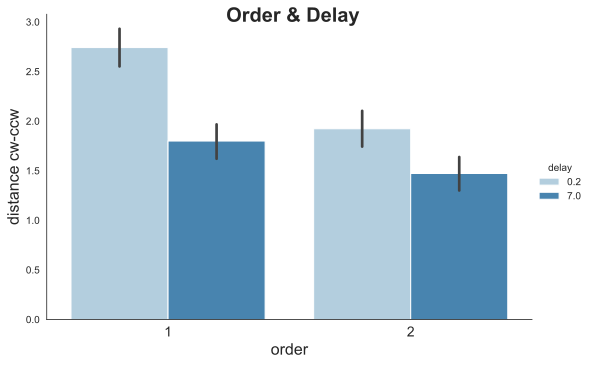

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: distance_A_err
No. Observations: 3920    Method:             REML          
No. Groups:       27      Scale:              24.6319       
Min. group size:  73      Likelihood:         -11892.1499   
Max. group size:  181     Converged:          Yes           
Mean group size:  145.2                                     
-------------------------------------------------------------
              Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
-------------------------------------------------------------
Intercept      3.468     0.570   6.083  0.000   2.351   4.586
delay         -0.199     0.074  -2.684  0.007  -0.344  -0.054
order         -0.799     0.234  -3.418  0.001  -1.257  -0.341
delay:order    0.075     0.047   1.599  0.110  -0.017   0.166
subject Var    5.070     0.294                               



In [31]:
g = sns.factorplot(x="order", y="distance_A_err", hue='delay', ci=69, data=df_analysis.loc[df_analysis['dist_in_out']=='in'],
                   kind='bar', palette='Blues', aspect=1.5)

sns.set_style('white')
plt.xlabel('order', fontsize=16)
plt.ylabel('distance cw-ccw', fontsize=16)
plt.xticks([0, 1], ['1', '2'], fontsize=14)

g.fig.suptitle('Order & Delay', fontsize=20, x=0.5, weight='demibold')

plt.show()

result = smf.mixedlm(formula="distance_A_err ~ delay*order ", data=df_analysis.loc[df_analysis['dist_in_out']=='in'], groups='subject').fit()
print(result.summary())

Linares plot

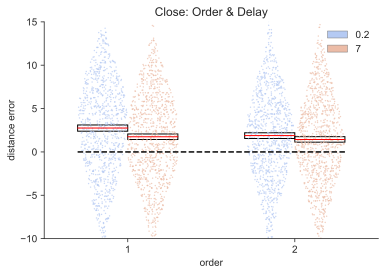

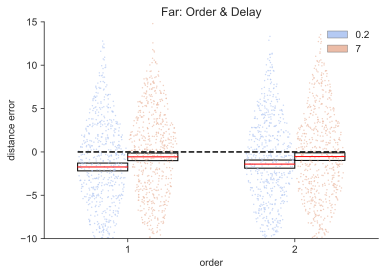

In [9]:
from linares_plot import *    

    
linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[df_analysis['dist_in_out']=='in'], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=1.5, alpha=0.7, width=0.6 )  
plt.ylim(-10,15)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('Close: Order & Delay')
plt.show(block=False)


linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[df_analysis['dist_in_out']=='out'], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=1.5, alpha=0.7, width=0.6 )  
plt.ylim(-10,15)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('Far: Order & Delay')
plt.show(block=False)


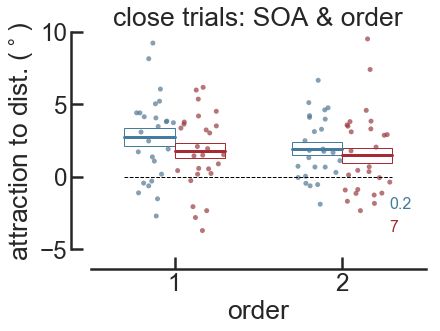

In [18]:
#from linares_plot import * 
%config InlineBackend.figure_format = 'png'

col_02 = '#457b9d'
col_7 = '#a82a33'
#linares_plot(x, y, df, palette, order, hue=None, hue_order=None, point_size=1, alpha=0.4, width=0.6, statistic=np.mean, by_subj=False, subj_col=None)

linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[df_analysis['dist_in_out']=='in'], 
             palette=[col_02, col_7], order=[1,2], hue_order=[0.2, 7], point_size=5, 
             alpha=0.7, width=0.6, by_subj=True, subj_col='subject', reps=1000,
            CI=0.69, loc_l=4)  
plt.ylim(-5,10)
plt.plot([-.3 ,1.3], [0,0], 'k--', linewidth=1)
plt.ylabel(r'attraction to dist. ($^\circ$)');
plt.title('close trials: SOA & order')
plt.show(block=False)

In [ ]:
#from linares_plot import * 
col_02 = '#457b9d'
col_7 = '#a82a33'
#linares_plot(x, y, df, palette, order, hue=None, hue_order=None, point_size=1, alpha=0.4, width=0.6, statistic=np.mean, by_subj=False, subj_col=None)

linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[df_analysis['dist_in_out']=='out'], 
             palette=[col_02, col_7], order=[1,2], hue_order=[0.2, 7], point_size=5, 
             alpha=0.7, width=0.6, by_subj=True, subj_col='subject', reps=1000,
            CI=0.69, loc_l=1)  
plt.ylim(-10,15)
plt.plot([-.3 ,1.3], [0,0], 'k--', linewidth=1)
plt.ylabel(r'attraction to dist. ($^\circ$)');
plt.title('far trials: SOA & order')
plt.show(block=False)

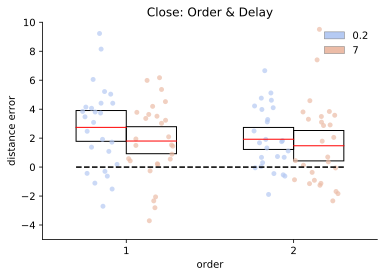

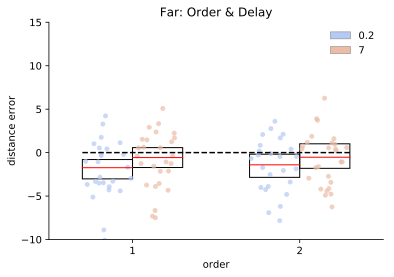

In [20]:
from linares_plot import * 
#linares_plot(x, y, df, palette, order, hue=None, hue_order=None, point_size=1, alpha=0.4, width=0.6, statistic=np.mean, by_subj=False, subj_col=None)

linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[df_analysis['dist_in_out']=='in'], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=5, alpha=0.7, width=0.6, by_subj=True, subj_col='subject' )  
plt.ylim(-5,10)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('Close: Order & Delay')
plt.show(block=False)


linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[df_analysis['dist_in_out']=='out'], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=5, alpha=0.7, width=0.6, by_subj=True, subj_col='subject' )  
plt.ylim(-10,15)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('Far: Order & Delay')
plt.show(block=False)


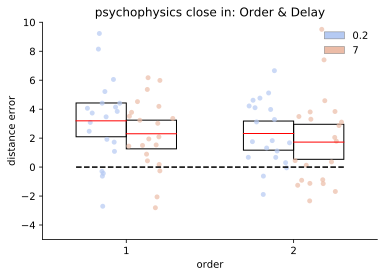

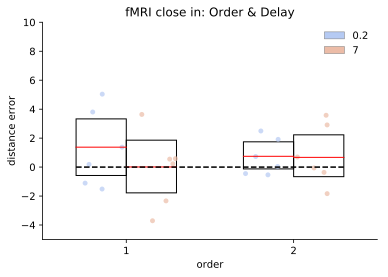

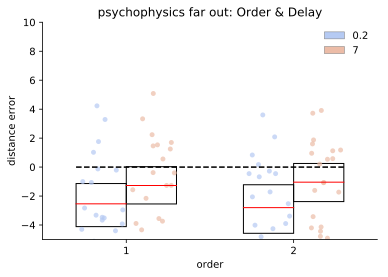

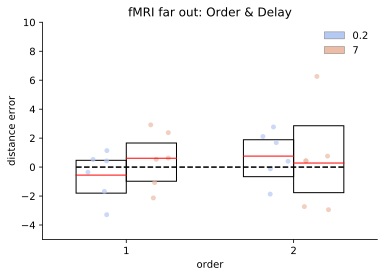

In [23]:
linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[(df_analysis['environment']=='psychophysics')&(df_analysis['dist_in_out']=='in')], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=5, alpha=0.7, width=0.6, by_subj=True, subj_col='subject' )  
plt.ylim(-5,10)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('psychophysics close in: Order & Delay')
plt.show(block=False)


linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[(df_analysis['environment']=='fMRI')&(df_analysis['dist_in_out']=='in')], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=5, alpha=0.7, width=0.6, by_subj=True, subj_col='subject' )  
plt.ylim(-5,10)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('fMRI close in: Order & Delay')
plt.show(block=False)

####


linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[(df_analysis['environment']=='psychophysics')&(df_analysis['dist_in_out']=='out')], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=5, alpha=0.7, width=0.6, by_subj=True, subj_col='subject' )  
plt.ylim(-5,10)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('psychophysics far out: Order & Delay')
plt.show(block=False)


linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[(df_analysis['environment']=='fMRI')&(df_analysis['dist_in_out']=='out')], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=5, alpha=0.7, width=0.6, by_subj=True, subj_col='subject' )  
plt.ylim(-5,10)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('fMRI far out: Order & Delay')
plt.show(block=False)





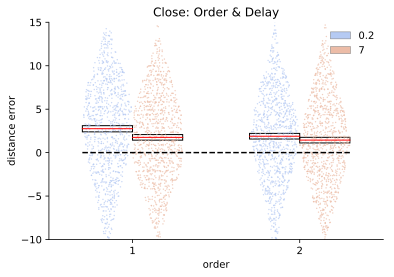

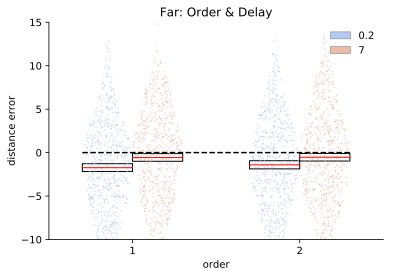

In [5]:
   

    
linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[df_analysis['dist_in_out']=='in'], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=1.5, alpha=0.7, width=0.6 )  
plt.ylim(-10,15)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('Close: Order & Delay')
plt.show(block=False)


linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[df_analysis['dist_in_out']=='out'], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=1.5, alpha=0.7, width=0.6 )  
plt.ylim(-10,15)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('Far: Order & Delay')
plt.show(block=False)




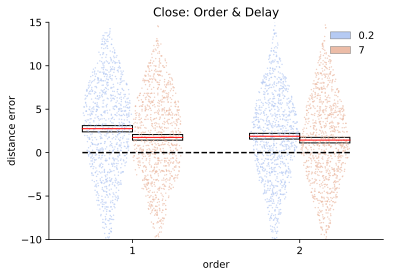

In [6]:
linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[df_analysis['dist_in_out']=='in'], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=1.5, alpha=0.7, width=0.6 )  
plt.ylim(-10,15)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('Close: Order & Delay')
plt.show(block=False)


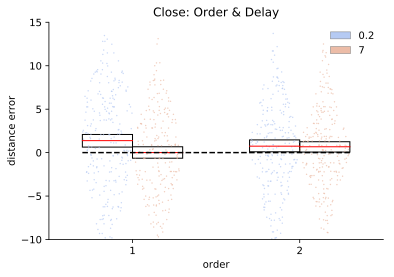

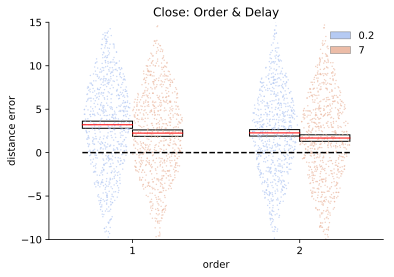

In [8]:
linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[(df_analysis['dist_in_out']=='in') & (df_analysis['environment']=='fMRI')], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=1.5, alpha=0.7, width=0.6 )  
plt.ylim(-10,15)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('Close: Order & Delay')
plt.show(block=False)


linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[(df_analysis['dist_in_out']=='in') & (df_analysis['environment']=='psychophysics')], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=1.5, alpha=0.7, width=0.6 )  
plt.ylim(-10,15)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('Close: Order & Delay')
plt.show(block=False)

In [11]:
df_analysis.columns

Index(['A_err', 'Interference', 'A_R', 'A_err_abs', 'delay', 'distance',
       'subject', 'order', 'cond', 'type', 'A_dist', 'A_T',
       'A_err_int_theoretical', 'A_res', 'A_err_theoretical', 'cw_ccw',
       'Interference_col', 'sex', 'dist_in_out', 'ord_del_cond',
       'distance_A_err'],
      dtype='object')

In [47]:
result = smf.mixedlm(formula="distance_A_err ~ delay*order*dist_in_out ", data=df_analysis, groups='subject').fit()
print(result.summary())

result = smf.mixedlm(formula="distance_A_err ~ delay*order + delay*dist_in_out + order*dist_in_out ", data=df_analysis, groups='subject').fit()
print(result.summary())

                  Mixed Linear Model Regression Results
Model:                 MixedLM     Dependent Variable:     distance_A_err
No. Observations:      6362        Method:                 REML          
No. Groups:            27          Scale:                  29.0392       
Min. group size:       107         Likelihood:             -19774.8987   
Max. group size:       354         Converged:              Yes           
Mean group size:       235.6                                             
-------------------------------------------------------------------------
                               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------------
Intercept                       3.627    0.428  8.474 0.000  2.788  4.466
dist_in_out[T.out]             -5.782    0.646 -8.945 0.000 -7.049 -4.515
delay                          -0.222    0.080 -2.758 0.006 -0.379 -0.064
delay:dist_in_out[T.out]        0.447    0.129  3.452 0.

In [54]:
result = smf.mixedlm(formula="distance_A_err ~ delay*order ", data=df_analysis.loc[df_analysis['dist_in_out']=='in'], groups='subject').fit()
print(result.summary())

result = smf.mixedlm(formula="distance_A_err ~ delay*order ", data=df_analysis.loc[df_analysis['dist_in_out']=='out'], groups='subject').fit()
print(result.summary())

result = smf.mixedlm(formula="distance_A_err ~ delay+order ", data=df_analysis.loc[df_analysis['dist_in_out']=='out'], groups='subject').fit()
print(result.summary())

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: distance_A_err
No. Observations: 3920    Method:             REML          
No. Groups:       27      Scale:              23.4243       
Min. group size:  73      Likelihood:         -11794.1352   
Max. group size:  181     Converged:          Yes           
Mean group size:  145.2                                     
-------------------------------------------------------------
              Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
-------------------------------------------------------------
Intercept      3.528     0.561   6.285  0.000   2.428   4.628
delay         -0.216     0.072  -2.985  0.003  -0.357  -0.074
order         -0.849     0.228  -3.725  0.000  -1.295  -0.402
delay:order    0.083     0.046   1.831  0.067  -0.006   0.173
subject Var    4.981     0.296                               

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Var

In [82]:
result = smf.mixedlm(formula="distance_A_err_abs ~ delay*dist_in_out ", data=df_analysis, groups='subject').fit()
print(result.summary())

result = smf.mixedlm(formula="distance_A_err_abs ~ order*dist_in_out ", data=df_analysis, groups='subject').fit()
print(result.summary())

               Mixed Linear Model Regression Results
Model:             MixedLM  Dependent Variable:  distance_A_err_abs
No. Observations:  6362     Method:              REML              
No. Groups:        27       Scale:               10.1354           
Min. group size:   107      Likelihood:          -16445.5576       
Max. group size:   354      Converged:           Yes               
Mean group size:   235.6                                           
-------------------------------------------------------------------
                         Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------
Intercept                 4.839    0.219 22.128 0.000  4.411  5.268
dist_in_out[T.out]       -0.067    0.121 -0.556 0.578 -0.305  0.170
delay                    -0.060    0.015 -4.014 0.000 -0.090 -0.031
delay:dist_in_out[T.out]  0.040    0.024  1.651 0.099 -0.007  0.087
subject Var               1.136    0.103                       

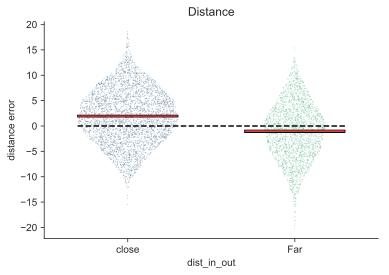

In [68]:
linares_plot(x='dist_in_out', y='distance_A_err', df= df_analysis, palette='viridis', 
              order=['in','out'],  point_size=1, alpha=0.4, width=0.6 )  
#plt.ylim(2,8)
plt.title('Distance')
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.xticks([0, 1], ['close', 'Far'], fontsize=10)
plt.show(block=False)

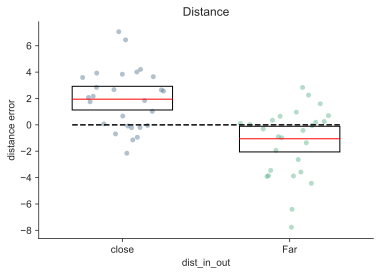

In [9]:
linares_plot(x='dist_in_out', y='distance_A_err', df= df_analysis, palette='viridis', 
              order=['in','out'],  point_size=5, alpha=0.4, width=0.6, by_subj=True, subj_col='subject' )  
#plt.ylim(2,8)
plt.title('Distance')
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.xticks([0, 1], ['close', 'Far'], fontsize=10)
plt.show(block=False)

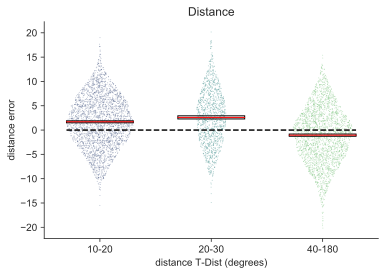

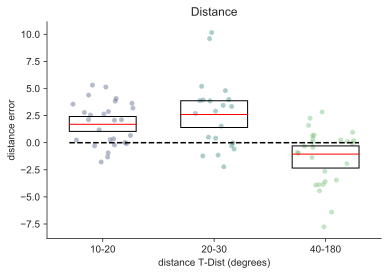

In [33]:
linares_plot(x='type', y='distance_A_err', df= df_analysis, palette='viridis', 
              order=[1,2,3],  point_size=1, alpha=0.4, width=0.6 )  
#plt.ylim(2,8)
plt.title('Distance')
plt.plot([-.3 ,2.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.xticks([0, 1, 2], ['10-20', '20-30', '40-180'], fontsize=10)
plt.xlabel('distance T-Dist (degrees)')
plt.show(block=False)



linares_plot(x='type', y='distance_A_err', df= df_analysis, palette='viridis', 
              order=[1,2,3],  point_size=5, alpha=0.4, width=0.6, by_subj=True, subj_col='subject' )  
#plt.ylim(2,8)
plt.title('Distance')
plt.plot([-.3 ,2.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.xticks([0, 1, 2], ['10-20', '20-30', '40-180'], fontsize=10)
plt.xlabel('distance T-Dist (degrees)')
plt.show(block=False)

In [34]:
df_analysis.type.unique()

array([1., 2., 3.])

In [35]:
result = smf.mixedlm(formula="distance_A_err ~ type*order*delay", data=df_analysis, groups='subject').fit()
print(result.summary())



           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: distance_A_err
No. Observations: 6362    Method:             REML          
No. Groups:       27      Scale:              30.4921       
Min. group size:  107     Likelihood:         -19932.1109   
Max. group size:  354     Converged:          Yes           
Mean group size:  235.6                                     
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept          6.738    0.782  8.617 0.000  5.205  8.271
type              -2.738    0.357 -7.679 0.000 -3.437 -2.040
order             -1.500    0.485 -3.092 0.002 -2.451 -0.549
type:order         0.573    0.225  2.541 0.011  0.131  1.015
delay             -0.486    0.154 -3.152 0.002 -0.788 -0.184
type:delay         0.227    0.072  3.167 0.002  0.086  0.367
order:delay        0.135    0.097  1

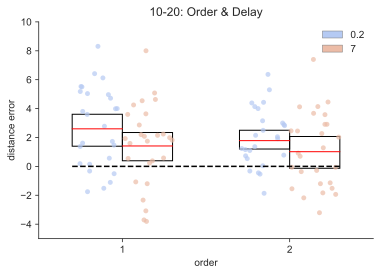

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: distance_A_err
No. Observations: 2721    Method:             REML          
No. Groups:       27      Scale:              24.6482       
Min. group size:  41      Likelihood:         -8261.1237    
Max. group size:  181     Converged:          Yes           
Mean group size:  100.8                                     
-------------------------------------------------------------
              Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
-------------------------------------------------------------
Intercept      3.485     0.575   6.060  0.000   2.358   4.612
delay         -0.240     0.089  -2.700  0.007  -0.413  -0.066
order         -0.795     0.279  -2.855  0.004  -1.341  -0.249
delay:order    0.070     0.056   1.248  0.212  -0.040   0.180
subject Var    3.647     0.220                               



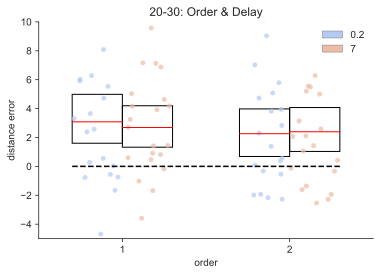

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: distance_A_err
No. Observations: 1199    Method:             REML          
No. Groups:       21      Scale:              22.5281       
Min. group size:  32      Likelihood:         -3604.7657    
Max. group size:  70      Converged:          Yes           
Mean group size:  57.1                                      
-------------------------------------------------------------
              Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
-------------------------------------------------------------
Intercept      3.843     0.957   4.013  0.000   1.966   5.719
delay         -0.105     0.130  -0.806  0.420  -0.359   0.150
order         -0.830     0.413  -2.012  0.044  -1.639  -0.021
delay:order    0.073     0.081   0.901  0.368  -0.086   0.232
subject Var   10.267     0.718                               



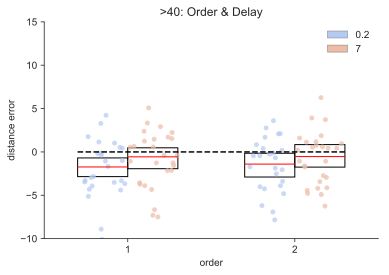

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: distance_A_err
No. Observations: 2442    Method:             REML          
No. Groups:       27      Scale:              26.2033       
Min. group size:  34      Likelihood:         -7496.7699    
Max. group size:  176     Converged:          Yes           
Mean group size:  90.4                                      
-------------------------------------------------------------
              Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
-------------------------------------------------------------
Intercept     -2.357     0.682  -3.456  0.001  -3.694  -1.020
delay          0.204     0.096   2.118  0.034   0.015   0.393
order          0.359     0.304   1.181  0.238  -0.237   0.955
delay:order   -0.048     0.061  -0.795  0.427  -0.168   0.071
subject Var    6.252     0.359                               



In [36]:
linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[df_analysis['type']==1], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=5, alpha=0.7, width=0.6, by_subj=True, subj_col='subject' )  
plt.ylim(-5,10)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('10-20: Order & Delay')
plt.show(block=False)


result = smf.mixedlm(formula="distance_A_err ~ delay*order ", data=df_analysis.loc[ df_analysis['type']==1], groups='subject').fit()
print(result.summary())


linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[df_analysis['type']==2], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=5, alpha=0.7, width=0.6, by_subj=True, subj_col='subject' )  
plt.ylim(-5,10)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('20-30: Order & Delay')
plt.show(block=False)


result = smf.mixedlm(formula="distance_A_err ~ delay*order ", data=df_analysis.loc[ df_analysis['type']==2], groups='subject').fit()
print(result.summary())


linares_plot(x='order', y='distance_A_err', hue='delay', df= df_analysis.loc[df_analysis['type']==3], palette='coolwarm', 
              order=[1,2], hue_order=[0.2, 7], point_size=5, alpha=0.7, width=0.6, by_subj=True, subj_col='subject' )  
plt.ylim(-10,15)
plt.plot([-.3 ,1.3], [0,0], 'k--')
plt.ylabel('distance error')
plt.title('>40: Order & Delay')
plt.show(block=False)

result = smf.mixedlm(formula="distance_A_err ~ delay*order ", data=df_analysis.loc[ df_analysis['type']==3], groups='subject').fit()
print(result.summary())

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


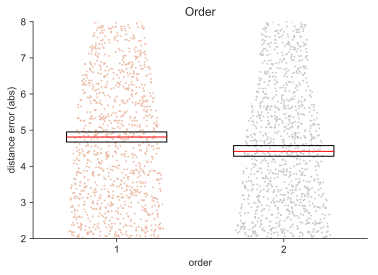

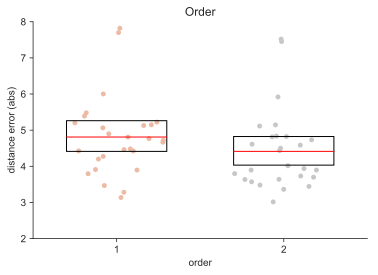

In [21]:
df_analysis['distance_A_err_abs'] = df_analysis['distance_A_err'].copy()
df_analysis.loc[ df_analysis['distance_A_err_abs']<0, 'distance_A_err_abs'] = df_analysis.loc[ df_analysis['distance_A_err_abs']<0, 'distance_A_err_abs']*-1
sns.distplot(df_analysis['distance_A_err_abs'])

linares_plot(x='order', y='distance_A_err_abs', df= df_analysis.loc[df_analysis['dist_in_out']=='in'], palette='RdGy', 
              order=[1,2], hue_order=[0.2, 7], point_size=1.9, alpha=1, width=0.6 )  
plt.ylim(2,8)
plt.ylabel('distance error (abs)')
plt.title('Order')
plt.show(block=False)

linares_plot(x='order', y='distance_A_err_abs', df= df_analysis.loc[df_analysis['dist_in_out']=='in'], palette='RdGy', 
              order=[1,2], hue_order=[0.2, 7], point_size=5, alpha=1, width=0.6, by_subj=True, subj_col='subject' )  
plt.ylim(2,8)
plt.ylabel('distance error (abs)')
plt.title('Order')
plt.show(block=False)


C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


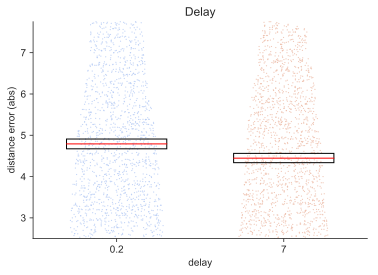

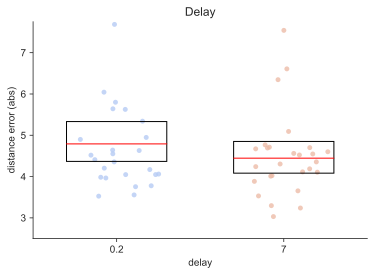

In [22]:
df_analysis['distance_A_err_abs'] = df_analysis['distance_A_err'].copy()
df_analysis.loc[ df_analysis['distance_A_err_abs']<0, 'distance_A_err_abs'] = df_analysis.loc[ df_analysis['distance_A_err_abs']<0, 'distance_A_err_abs']*-1
sns.distplot(df_analysis['distance_A_err_abs'])

linares_plot(x='delay', y='distance_A_err_abs', df= df_analysis, palette='coolwarm', 
              order=[0.2, 7], point_size=1.3, alpha=0.8, width=0.6 )  
plt.ylim(2.5, 7.75)
plt.ylabel('distance error (abs)')
plt.title('Delay')
plt.show(block=False)

linares_plot(x='delay', y='distance_A_err_abs', df= df_analysis, palette='coolwarm', 
              order=[0.2, 7], point_size=5, alpha=0.8, width=0.6, by_subj=True, subj_col='subject' )  
plt.ylim(2.5, 7.75)
plt.ylabel('distance error (abs)')
plt.title('Delay')
plt.show(block=False)



Rainplot

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


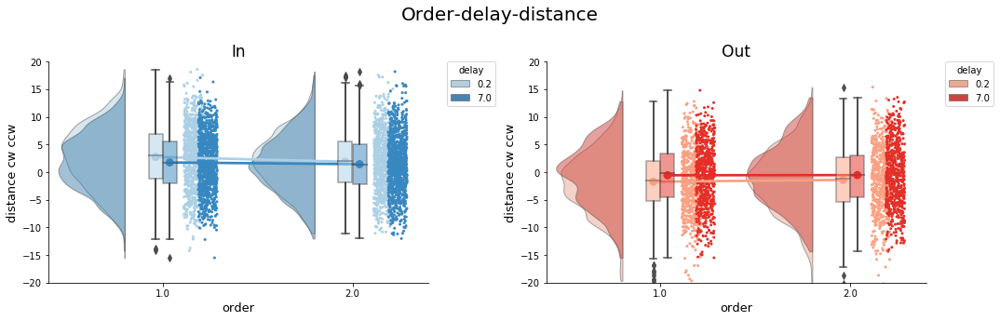

In [10]:
fig = plt.figure()
fig.set_size_inches(15, 5)
fig.suptitle('Order-delay-distance', size=20)

dx="order"; dy="distance_A_err"; dhue="delay"; sigma=.2; ort="o"

ax1=plt.subplot(121)
pt.RainCloud(ax=ax1, x = dx, y = dy, hue=dhue, data=df_analysis.loc[df_analysis['dist_in_out']=='in'],  palette = 'Blues', bw = sigma, width_viol = .7, 
                orient =ort , alpha = .5, dodge = True, pointplot = True, move = .2)

ax2=plt.subplot(122)

pt.RainCloud(ax=ax2, x = dx, y = dy, hue=dhue, data=df_analysis.loc[df_analysis['dist_in_out']=='out'],  palette = 'Reds', bw = sigma, width_viol = .7, 
                orient =ort , alpha = .5, dodge = True, pointplot = True, move = .2)

axes=[ax1, ax2]
Titles=['In', 'Out']

for i, Ax in enumerate(axes):
    Ax.spines['right'].set_visible(False)
    Ax.spines['top'].set_visible(False)
    Ax.set_title(Titles[i],fontdict={'fontsize': 17, 'fontweight': 'medium'})
    Ax.set_ylabel('distance cw ccw', fontsize=13)
    Ax.set_xlabel('order' , fontsize=13)
    Ax.set_xlim(-0.6, 1.4)
    Ax.set_ylim(-20, 20)

    
##
fig.tight_layout(rect=[0, 0.03, 1, 0.90])

In [30]:
df_analysis.columns
df_analysis[['A_R', 'A_T', 'A_res', 'A_err_theoretical', 'A_err', 'A_err_int_theoretical', 'Interference'  ]].head(10)


,A_R,A_T,A_res,A_err_theoretical,A_err,A_err_int_theoretical,Interference
0,53.965,57.0,51.0,6.0,-2.497,6.0,-2.497
1,307.219,315.0,302.0,13.0,14.948,13.0,14.948
3,146.091,145.0,148.0,-3.0,-2.721,-3.0,-2.721
4,228.611,226.0,227.0,-1.0,-11.073,-1.0,-11.073
5,61.965,66.0,59.0,7.0,-0.068,7.0,0.068
7,313.219,318.0,308.0,10.0,-2.110,10.0,-2.110
8,333.219,325.0,328.0,-3.0,-14.467,-3.0,-14.467
9,57.965,49.0,55.0,-6.0,-15.767,-6.0,-15.767
10,158.091,153.0,160.0,-7.0,-2.380,-7.0,-2.380
11,40.965,57.0,38.0,19.0,10.503,-19.0,-10.503


In [26]:
#### Models with the old measure

result = smf.mixedlm(formula="A_err_int_theoretical ~ delay*order*dist_in_out ", data=df_analysis, groups='subject').fit()
print(result.summary())

result = smf.mixedlm(formula="A_err_theoretical ~ cw_ccw*delay*order*dist_in_out ", data=df_analysis, groups='subject').fit()
print(result.summary())


                  Mixed Linear Model Regression Results
Model:              MixedLM   Dependent Variable:   A_err_int_theoretical
No. Observations:   6362      Method:               REML                 
No. Groups:         27        Scale:                99.4595              
Min. group size:    107       Likelihood:           -23682.4790          
Max. group size:    354       Converged:            Yes                  
Mean group size:    235.6                                                
-------------------------------------------------------------------------
                               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------------
Intercept                       3.367    0.778  4.328 0.000  1.843  4.892
dist_in_out[T.out]             -5.911    1.196 -4.942 0.000 -8.256 -3.567
delay                          -0.239    0.149 -1.606 0.108 -0.531  0.053
delay:dist_in_out[T.out]        0.599    0.240  2.501 0.

Categories analysis:  

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


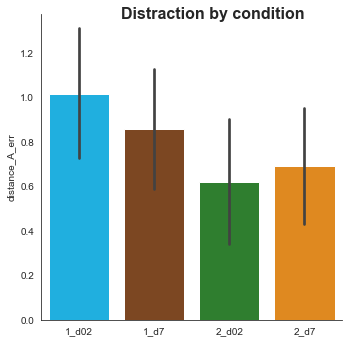

             Mixed Linear Model Regression Results
Model:              MixedLM  Dependent Variable:  distance_A_err
No. Observations:   6362     Method:              REML          
No. Groups:         27       Scale:               31.3515       
Min. group size:    107      Likelihood:          -20010.8380   
Max. group size:    354      Converged:           Yes           
Mean group size:    235.6                                       
----------------------------------------------------------------
                      Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------
Intercept              1.014    0.207  4.902 0.000  0.609  1.420
ord_del_cond[T.1_d7]  -0.125    0.200 -0.626 0.531 -0.517  0.267
ord_del_cond[T.2_d02] -0.397    0.201 -1.979 0.048 -0.790 -0.004
ord_del_cond[T.2_d7]  -0.289    0.199 -1.454 0.146 -0.679  0.101
subject Var            0.601    0.037                           



In [18]:

order_cat = ['1_d02',  '1_d7', '2_d02', '2_d7']
df_analysis['ord_del_cond'] = pd.Categorical(df_analysis['ord_del_cond'], order_cat)

g = sns.factorplot(x="ord_del_cond", y="distance_A_err", data=df_analysis,
                   kind='bar', palette=['deepskyblue', 'saddlebrown', 'forestgreen','darkorange'])
sns.set_style('white')
g.set_axis_labels("", "distance_A_err")
g.set_xticklabels(order_cat)
g.fig.suptitle('Distraction by condition', fontsize=16, x=0.6, weight='demibold')
plt.show()

####
result = smf.mixedlm(formula="distance_A_err ~ ord_del_cond", data=df_analysis, groups='subject').fit()
print(result.summary())  



Rainplot

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


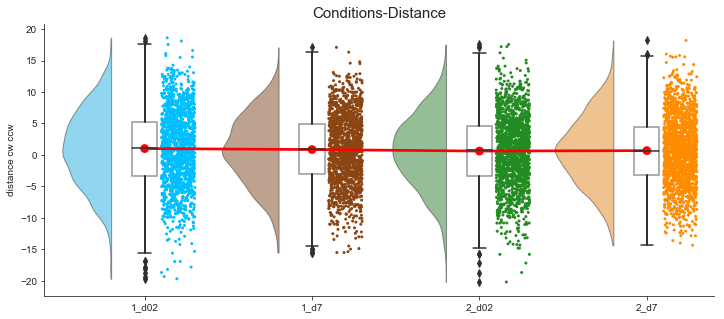

In [31]:
dx="ord_del_cond"; dy="distance_A_err"; sigma=.2; pal=['deepskyblue', 'saddlebrown', 'forestgreen','darkorange']; ort="o"
ax=pt.RainCloud( x = dx, y = dy, data=df_analysis,  palette = pal, bw = sigma, width_viol = .7,
                 figsize = (12,5), orient =ort , alpha = .5, dodge = True, pointplot = True, move = .2)


plt.title('Conditions-Distance', size=15)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().get_xaxis().tick_bottom()
plt.gca().get_yaxis().tick_left()
plt.ylabel('distance cw ccw' )
plt.xlabel('')
plt.xlim(-0.6, 3.4)
plt.show()


Conditions.
Both in and out

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\David\Anaconda3\envs\python3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update yo

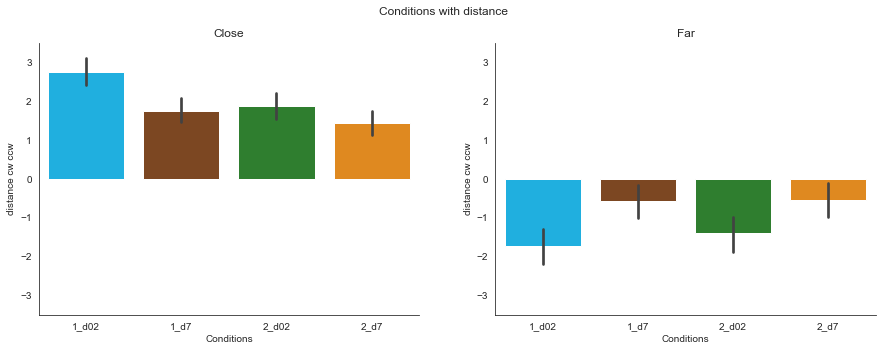

In


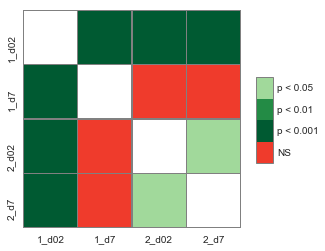

Out


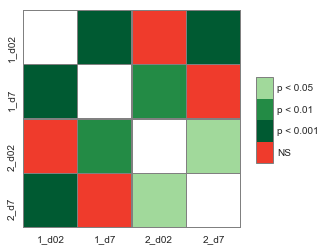

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


             Mixed Linear Model Regression Results
Model:              MixedLM  Dependent Variable:  distance_A_err
No. Observations:   3920     Method:              REML          
No. Groups:         27       Scale:               23.4243       
Min. group size:    73       Likelihood:          -11790.3014   
Max. group size:    181      Converged:           Yes           
Mean group size:    145.2                                       
----------------------------------------------------------------
                      Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------
Intercept              2.652    0.458  5.795 0.000  1.755  3.550
ord_del_cond[T.1_d7]  -0.900    0.221 -4.073 0.000 -1.333 -0.467
ord_del_cond[T.2_d02] -0.832    0.221 -3.761 0.000 -1.266 -0.398
ord_del_cond[T.2_d7]  -1.166    0.219 -5.320 0.000 -1.595 -0.736
subject Var            4.981    0.296                           

             Mixed Linear Model Regres

In [20]:
fig = plt.figure()
fig.set_size_inches(15, 5)
fig.tight_layout()
fig.suptitle('Conditions with distance')
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

g = sns.factorplot(ax= ax1, x="ord_del_cond", y="distance_A_err", data=df_analysis.loc[df_analysis['dist_in_out']=='in'],
                   kind='bar', palette=['deepskyblue', 'saddlebrown', 'forestgreen','darkorange'])


h= sns.factorplot(ax= ax2, x="ord_del_cond", y="distance_A_err", data=df_analysis.loc[df_analysis['dist_in_out']=='out'],
                   kind='bar', palette=['deepskyblue', 'saddlebrown', 'forestgreen','darkorange'])

plt.close()
plt.close()

axes=[ax1, ax2]
Titles=['Close', 'Far']

for i, Ax in enumerate(axes):
    Ax.spines['right'].set_visible(False)
    Ax.spines['top'].set_visible(False)
    Ax.title.set_text(Titles[i])
    #Ax.legend_.remove()
    #Ax.set_xticklabels(['in','out'])
    Ax.set_xlabel('Conditions')
    Ax.set_ylabel('distance cw ccw')
    Ax.set_ylim(-3.5,3.5)


plt.show()


####
print('In')
pc = sp.posthoc_mannwhitney(df_analysis.loc[df_analysis['dist_in_out']=='in'], val_col='distance_A_err', group_col='ord_del_cond') 
heatmap_args = {'linewidths': 0.25, 'linecolor': '0.5', 'clip_on': False, 'square': True, 'cbar_ax_bbox': [0.80, 0.35, 0.04, 0.3]}
sp.sign_plot(pc, **heatmap_args)
plt.show()
#print(pc)


print('Out')
pc = sp.posthoc_mannwhitney(df_analysis.loc[df_analysis['dist_in_out']=='out'], val_col='distance_A_err', group_col='ord_del_cond') 
heatmap_args = {'linewidths': 0.25, 'linecolor': '0.5', 'clip_on': False, 'square': True, 'cbar_ax_bbox': [0.80, 0.35, 0.04, 0.3]}
sp.sign_plot(pc, **heatmap_args)
plt.show()
#print(pc)



result = smf.mixedlm(formula="distance_A_err ~ ord_del_cond", data=df_analysis.loc[df_analysis['dist_in_out']=='in'], groups='subject').fit()
print(result.summary())  
    
result = smf.mixedlm(formula="distance_A_err ~ ord_del_cond", data=df_analysis.loc[df_analysis['dist_in_out']=='out'], groups='subject').fit()
print(result.summary())  

Rainplot

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


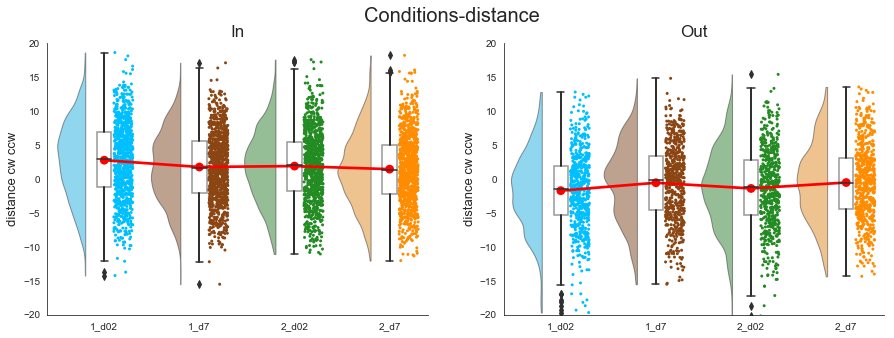

In [23]:
fig = plt.figure()
fig.set_size_inches(15, 5)
fig.suptitle('Conditions-distance', size=20)


ax1=plt.subplot(121)
dx="ord_del_cond"; dy="distance_A_err"; sigma=.2; pal=['deepskyblue', 'saddlebrown', 'forestgreen','darkorange']; ort="o"
ax=pt.RainCloud(ax=ax1, x = dx, y = dy, data=df_analysis.loc[df_analysis['dist_in_out']=='in'],  palette = pal, bw = sigma, width_viol = .7,
                 orient =ort , alpha = .5, dodge = True, pointplot = True, move = .2)


ax2=plt.subplot(122)
dx="ord_del_cond"; dy="distance_A_err"; sigma=.2; pal=['deepskyblue', 'saddlebrown', 'forestgreen','darkorange']; ort="o"
ax=pt.RainCloud(ax=ax2, x = dx, y = dy, data=df_analysis.loc[df_analysis['dist_in_out']=='out'],  palette = pal, bw = sigma, width_viol = .7,
                 orient =ort , alpha = .5, dodge = True, pointplot = True, move = .2)


axes=[ax1, ax2]
Titles=['In', 'Out']

for i, Ax in enumerate(axes):
    Ax.spines['right'].set_visible(False)
    Ax.spines['top'].set_visible(False)
    Ax.set_title(Titles[i],fontdict={'fontsize': 17, 'fontweight': 'medium'})
    Ax.set_ylabel('distance cw ccw', fontsize=13)
    Ax.set_xlabel('' , fontsize=13)
    Ax.set_xlim(-0.6, 3.4)
    Ax.set_ylim(-20, 20)

Main effects

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


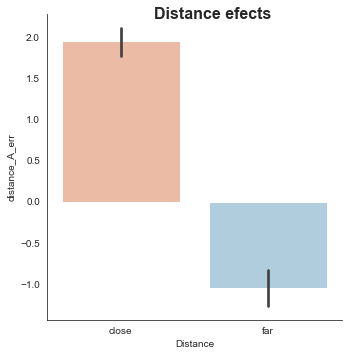

            Mixed Linear Model Regression Results
Model:              MixedLM Dependent Variable: distance_A_err
No. Observations:   6362    Method:             REML          
No. Groups:         27      Scale:              29.2602       
Min. group size:    107     Likelihood:         -19791.3737   
Max. group size:    354     Converged:          Yes           
Mean group size:    235.6                                     
--------------------------------------------------------------
                   Coef.  Std.Err.    z    P>|z| [0.025 0.975]
--------------------------------------------------------------
Intercept           1.935    0.171  11.302 0.000  1.599  2.271
dist_in_out[T.out] -3.012    0.141 -21.361 0.000 -3.288 -2.736
subject Var         0.588    0.037                            



C:\Users\David\Anaconda3\envs\python3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


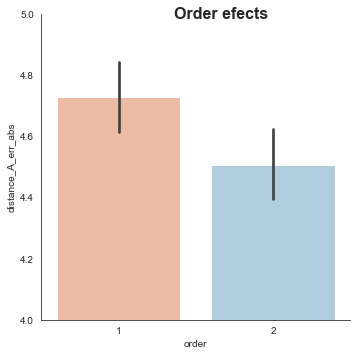

             Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: distance_A_err_abs
No. Observations: 6362    Method:             REML              
No. Groups:       27      Scale:              10.1492           
Min. group size:  107     Likelihood:         -16444.6565       
Max. group size:  354     Converged:          Yes               
Mean group size:  235.6                                         
------------------------------------------------------------------
              Coef.    Std.Err.     z      P>|z|   [0.025   0.975]
------------------------------------------------------------------
Intercept      4.969      0.242   20.553   0.000    4.495    5.443
order         -0.216      0.080   -2.708   0.007   -0.373   -0.060
subject Var    1.143      0.104                                   



C:\Users\David\Anaconda3\envs\python3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


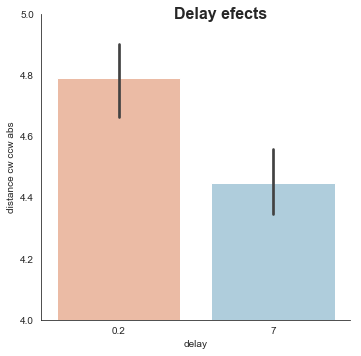

             Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: distance_A_err_abs
No. Observations: 6362    Method:             REML              
No. Groups:       27      Scale:              10.1381           
Min. group size:  107     Likelihood:         -16442.9938       
Max. group size:  354     Converged:          Yes               
Mean group size:  235.6                                         
------------------------------------------------------------------
              Coef.    Std.Err.     z      P>|z|   [0.025   0.975]
------------------------------------------------------------------
Intercept      4.812      0.214   22.527   0.000    4.393    5.231
delay         -0.045      0.012   -3.806   0.000   -0.068   -0.022
subject Var    1.134      0.103                                   



In [26]:
#Plots summary

#### Distance
g = sns.factorplot(x="dist_in_out", y="distance_A_err", data=df_analysis,
                   kind='bar', palette='RdBu')

sns.set_style('white')
g.set_axis_labels("Distance", "distance_A_err")
g.set_xticklabels(['close','far'])
g.fig.suptitle('Distance efects', fontsize=16, x=0.6, weight='demibold')

plt.show()

result = smf.mixedlm(formula="distance_A_err ~ dist_in_out", data=df_analysis, groups='subject').fit()
print(result.summary())




df_analysis['distance_A_err_abs'] = df_analysis['distance_A_err'].copy()
df_analysis['distance_A_err_abs'] = abs(df_analysis['distance_A_err_abs'])



#### Order
g = sns.factorplot(x="order", y="distance_A_err_abs", data=df_analysis,
                   kind='bar', palette='RdBu')

sns.set_style('white')
g.set_axis_labels("order", "distance_A_err_abs")
g.set_xticklabels(['1','2'])
plt.ylim(4,5)
g.fig.suptitle('Order efects', fontsize=16, x=0.6, weight='demibold')

plt.show()

result = smf.mixedlm(formula="distance_A_err_abs ~ order", data=df_analysis, groups='subject').fit()
print(result.summary())



####  Delay
g = sns.factorplot(x="delay", y="distance_A_err_abs", data=df_analysis,
                   kind='bar', palette='RdBu')

sns.set_style('white')
g.set_axis_labels("delay", "distance cw ccw abs")
g.set_xticklabels(['0.2','7'])
#plt.ylim(7.5,10.5)
plt.ylim(4,5)
g.fig.suptitle('Delay efects', fontsize=16, x=0.6, weight='demibold')

plt.show()

result = smf.mixedlm(formula="distance_A_err_abs ~ delay", data=df_analysis, groups='subject').fit()
print(result.summary())



Rainplots

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


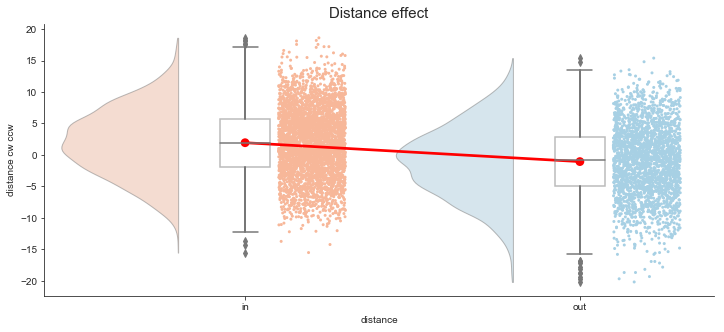

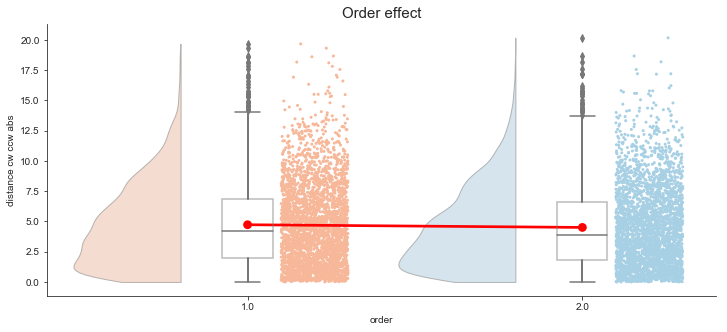

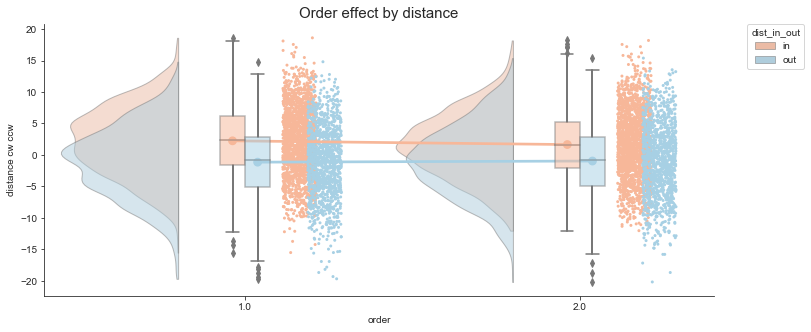

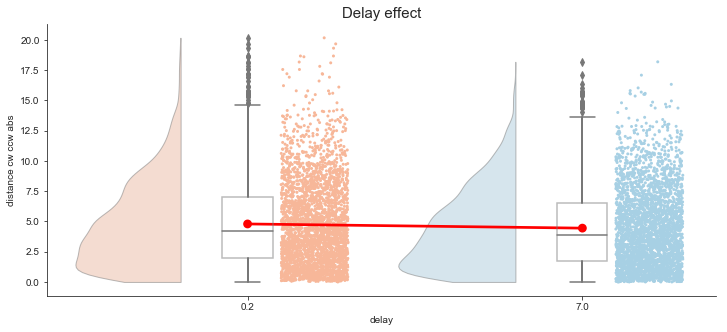

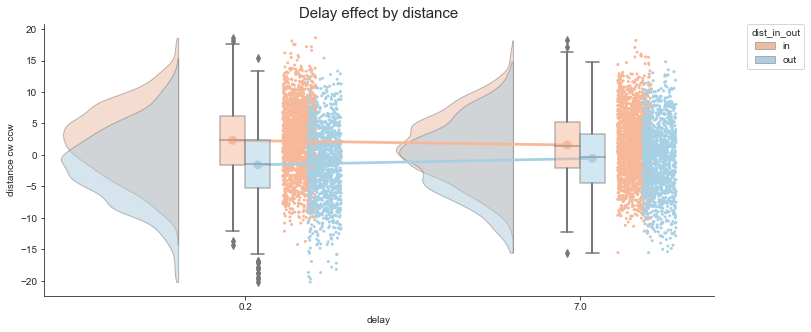

In [28]:
dx="dist_in_out"; dy="distance_A_err"; sigma=.2; pal='RdBu'; ort="o"
ax=pt.RainCloud(x = dx, y = dy, data = df_analysis,  palette = pal, bw = sigma, width_viol = .7,
                figsize = (12,5), orient =ort , alpha = .5, dodge = True, pointplot = True, move = .2)

plt.title('Distance effect', size=15)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().get_xaxis().tick_bottom()
plt.gca().get_yaxis().tick_left()
plt.ylabel('distance cw ccw')
plt.xlabel('distance')
plt.xlim(-0.6, 1.4)
plt.show()



dx="order"; dy="distance_A_err_abs"; sigma=.2; pal='RdBu'; ort="o"
ax=pt.RainCloud(x = dx, y = dy, data = df_analysis,  palette = pal, bw = sigma, width_viol = .7,
                figsize = (12,5), orient =ort , alpha = .5, dodge = True, pointplot = True, move = .2)

plt.title('Order effect', size=15)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().get_xaxis().tick_bottom()
plt.gca().get_yaxis().tick_left()
plt.ylabel('distance cw ccw abs')
plt.xlabel('order')
plt.xlim(-0.6, 1.4)
plt.show()


dx="order"; dy="distance_A_err"; dhue="dist_in_out"; sigma=.2; pal='RdBu'; ort="o"
ax=pt.RainCloud(x = dx, y = dy, hue=dhue, data = df_analysis,  palette = pal, bw = sigma, width_viol = .7,
                figsize = (12,5), orient =ort , alpha = .5, dodge = True, pointplot = True, move = .2)

plt.title('Order effect by distance', size=15)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().get_xaxis().tick_bottom()
plt.gca().get_yaxis().tick_left()
plt.ylabel('distance cw ccw')
plt.xlabel('order')
plt.xlim(-0.6, 1.4)
plt.show()



dx="delay"; dy="distance_A_err_abs"; sigma=.2; pal='RdBu'; ort="o"
ax=pt.RainCloud(x = dx, y = dy, data = df_analysis,  palette = pal, bw = sigma, width_viol = .7,
                figsize = (12,5), orient =ort , alpha = .5, dodge = True, pointplot = True, move = .2)

plt.title('Delay effect', size=15)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().get_xaxis().tick_bottom()
plt.gca().get_yaxis().tick_left()
plt.ylabel('distance cw ccw abs')
plt.xlabel('delay')
plt.xlim(-0.6, 1.4)
plt.show()


dx="delay"; dy="distance_A_err"; dhue="dist_in_out"; sigma=.2; pal='RdBu'; ort="o"
ax=pt.RainCloud(x = dx, y = dy, hue=dhue, data = df_analysis,  palette = pal, bw = sigma, width_viol = .7,
                figsize = (12,5), orient =ort , alpha = .5, dodge = True, pointplot = True, move = .2)

plt.title('Delay effect by distance', size=15)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().get_xaxis().tick_bottom()
plt.gca().get_yaxis().tick_left()
plt.ylabel('distance cw ccw' )
plt.xlabel('delay')
plt.xlim(-0.6, 1.4)
plt.show()

Control for cw-ccw effect of distraction.  
Overall

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


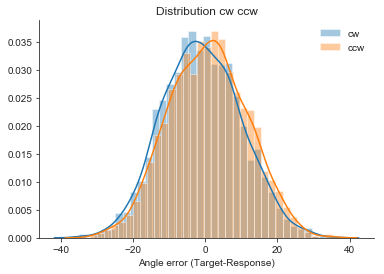

-0.9409125560538119
0.6900623456790118


Ttest_indResult(statistic=-6.02040496776105, pvalue=1.836811227951587e-09)

In [29]:
### Distribution A_Err in cw-ccw
sns.distplot(df_analysis.loc[df_analysis['cw_ccw']=='cw', 'A_err'], label='cw')
sns.distplot(df_analysis.loc[df_analysis['cw_ccw']=='ccw', 'A_err'], label='ccw')
plt.title('Distribution cw ccw')
plt.legend(frameon=False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().get_xaxis().tick_bottom()
plt.gca().get_yaxis().tick_left()
plt.xlabel('Angle error (Target-Response)')
plt.show()

print(df_analysis.loc[df_analysis['cw_ccw']=='cw', 'A_err'].mean())
print(df_analysis.loc[df_analysis['cw_ccw']=='ccw', 'A_err'].mean())

scipy.stats.ttest_ind(df_analysis.loc[df_analysis['cw_ccw']=='cw', 'A_err'], df_analysis.loc[df_analysis['cw_ccw']=='ccw', 'A_err'] )

C:\Users\David\Anaconda3\envs\python3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


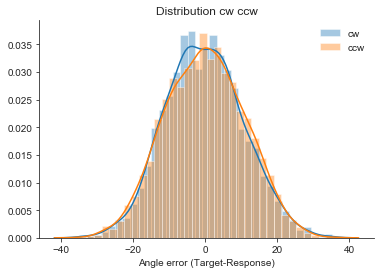

0.21939718920286957


Ttest_indResult(statistic=-0.8076026911790836, pvalue=0.41934953976039424)

In [46]:
### Shuffle 

a=np.array(df_analysis['cw_ccw'].values)
random.shuffle(a)
df_analysis['cw_ccw_shuff'] = a


sns.distplot(df_analysis.loc[df_analysis['cw_ccw_shuff']=='cw', 'A_err'], label='cw')
sns.distplot(df_analysis.loc[df_analysis['cw_ccw_shuff']=='ccw', 'A_err'], label='ccw')
plt.title('Distribution cw ccw')
plt.legend(frameon=False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().get_xaxis().tick_bottom()
plt.gca().get_yaxis().tick_left()
plt.xlabel('Angle error (Target-Response)')
plt.show()


print(abs(df_analysis.loc[df_analysis['cw_ccw_shuff']=='cw', 'A_err'].mean() - df_analysis.loc[df_analysis['cw_ccw_shuff']=='ccw', 'A_err'].mean()))
scipy.stats.ttest_ind(df_analysis.loc[df_analysis['cw_ccw_shuff']=='cw', 'A_err'], df_analysis.loc[df_analysis['cw_ccw_shuff']=='ccw', 'A_err'] )


